# ACT Environment grasslands analysis

## Input datasets:
- ACT Ground Sampling data (gpkg file)
- Sentinel-2 time-series data (pkl file)
    - This data is downloaded using the **_main.sh bash scripts

## Steps
1. Load ground sampling (GS) and satellite data
2. Crop one or both datasets to shared bounds
3. Merge satellite and gorund sampling data... each row in the GS data will have a timeseries stack of sentinel-2 data for that site
4. calculate indices for all sites through time.
5. Group and plot data via various methods.



### Setup

#### Imports and functions

In [2]:
import geopandas as gpd
import pandas as pd
import numpy as np
import seaborn as sns
import rasterio #
import xarray as xr
import matplotlib.pyplot as plt 
import matplotlib
import rioxarray
from ipyleaflet import Map, GeoData, DrawControl, basemaps, WidgetControl
from ipywidgets import Button, Layout
from shapely.geometry import Polygon
from shapely.geometry import mapping

from joblib import Parallel, delayed
from tqdm import tqdm

%matplotlib inline

import cv2 
from matplotlib.gridspec import GridSpec
from dea_tools.plotting import display_map, rgb, xr_animation
import skimage

from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.preprocessing import TimeSeriesResampler
from tslearn.clustering import KShape, KernelKMeans, silhouette_score
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans

from IPython.display import Image
from IPython.core.display import Video

import pickle
import os
import shutil

import ffmpeg # REQUIRES a module load ffmpeg/4.3.1 (in jupyterlab, must do when setting up sesh)

## For running on desktop
from pathlib import Path



#####################
## Various functions used for fixing CRS and cropping the satellite and plot data to correct extents

def plot_satellite_and_data_extents(pad_man, ds_weekly, list_external_indices = False):

    # Get bounds of pad_man_reprojected
    pad_bounds = pad_man.total_bounds
    print("pad_man_reprojected bounds:", pad_bounds,)
    
    # Step 1: Get the bounds of ds_weekly
    ds_bounds = ds_weekly.rio.bounds()  # Returns (minx, miny, maxx, maxy)
    ds_extent = box(*ds_bounds)  # Create a shapely Polygon representing the raster bounds
    
    # Step 2: Check if pad_man's geometries are within ds_weekly's bounds
    
    # Create a GeoDataFrame containing the raster extent for spatial operations
    ds_extent_gdf = gpd.GeoDataFrame({'geometry': [ds_extent]}, crs=pad_man.crs)
    
    # Identify geometries that are not entirely within the raster extent
    outside_bounds = pad_man[~pad_man.geometry.within(ds_extent)]
    
    # Step 3: Warn the user if any geometries are outside the raster bounds
    if not outside_bounds.empty:
        num_outside = len(outside_bounds)
        total_geometries = len(outside_bounds)
        print(f"Warning: {num_outside} out of {total_geometries} geometries in 'pad_man' extend beyond 'ds_weekly's extent.")
        if list_external_indices: print("WARNING: Indices of geometries outside the raster bounds:", outside_bounds.index.tolist())
    else:
        print("All geometries in 'pad_man' are within the bounds of 'ds_weekly'.")
    
    import matplotlib.pyplot as plt
    
    
    # Plot the raster extent
    fig, ax = plt.subplots(figsize=(10, 10))
    
    ds_extent_gdf.boundary.plot(ax=ax, edgecolor='blue', linewidth=2, label='ds_layers (Sentinel) Raster Bounds')
    
    # Plot all geometries
    pad_man.boundary.plot(ax=ax, edgecolor='green', linewidth=1, label='pad_man Geometries')
    
    # Highlight geometries outside the raster bounds
    if not outside_bounds.empty:
        outside_bounds.boundary.plot(ax=ax, edgecolor='red', linewidth=1, label='Outside Geometries')
    
    plt.legend()
    plt.title('Geometries and Raster Extent')
    plt.show()


def crop_to_bounds(pad_man, ds_weekly, crop_option='crop_site_to_sentinel', padding=0):
    """
    Crop one geospatial dataset to another with padding.
    
    Parameters:
    -----------
    pad_man : GeoDataFrame
        The vector dataset
    ds_weekly : xarray.Dataset
        The raster dataset
    crop_option : str
        Either 'crop_site_to_sentinel' or 'crop_sentinel_to_site'
    padding : float
        Padding in coordinate units (e.g., degrees if using geographic coordinates)
        Default is 0.001 (approximately 100m at the equator if using degrees)
    """
    if padding==0:
        print("No padding value passed; data will be cropped without padding")
        
    # Get the bounds of the xarray dataset
    ds_bounds = ds_weekly.rio.bounds()  # Returns (minx, miny, maxx, maxy)
    
    if crop_option == 'crop_site_to_sentinel':
        # Add padding to make the extent slightly smaller
        ds_bounds_padded = (
            ds_bounds[0] + padding,  # minx + padding
            ds_bounds[1] + padding,  # miny + padding
            ds_bounds[2] - padding,  # maxx - padding
            ds_bounds[3] - padding   # maxy - padding
        )
        ds_extent = box(*ds_bounds_padded)
        
        # Create a GeoDataFrame containing the padded raster extent
        ds_extent_gdf = gpd.GeoDataFrame({'geometry': [ds_extent]}, crs=pad_man.crs)
        
        # Crop pad_man to ds_weekly's bounds
        pad_man_clipped = gpd.overlay(pad_man, ds_extent_gdf, how='intersection')
        return pad_man_clipped, ds_weekly

    elif crop_option == 'crop_sentinel_to_site':
        # Get the bounds of the pad_man GeoDataFrame
        pad_bounds = pad_man.total_bounds  # Returns (minx, miny, maxx, maxy)
        
        # Add padding to make the extent slightly smaller
        pad_bounds_padded = (
            pad_bounds[0] - padding,  # minx - padding
            pad_bounds[1] - padding,  # miny - padding
            pad_bounds[2] + padding,  # maxx + padding
            pad_bounds[3] + padding   # maxy + padding
        )
        
        # Crop ds_weekly to pad_man's bounds with padding
        ds_weekly_cropped = ds_weekly.rio.clip_box(*pad_bounds_padded)
        return pad_man, ds_weekly_cropped

    else:
        raise ValueError("Invalid crop_option. Choose 'crop_site_to_sentinel' or 'crop_sentinel_to_site'.")
        

### Some helper code (used while loading the pkl files of downloaded Sentinel data)
def format_size(bytes):
    """Convert bytes to human readable format"""
    for unit in ['B', 'KB', 'MB', 'GB', 'TB']:
        if bytes < 1024:
            return f"{bytes:.2f} {unit}"
        bytes /= 1024

# Monitor memory usage
def monitor_memory_threaded(interval=3):
    """Periodically reports system memory usage."""
    while not stop_monitor:
        # Get system memory usage
        memory_info = psutil.virtual_memory()
        used_mem = memory_info.used / (1024 ** 3)  # Convert to GB
        total_mem = memory_info.total / (1024 ** 3)  # Convert to GB
        print(f"Memory Usage: {used_mem:.2f} GB / {total_mem:.2f} GB")
        time.sleep(interval)

def return_memory_usage():
    """Report system memory usage."""
    memory_info = psutil.virtual_memory()
    used_mem = memory_info.used / (1024 ** 3)  # Convert to GB
    total_mem = memory_info.total / (1024 ** 3)  # Convert to GB
    print(f"Memory Usage: {used_mem:.2f} GB / {total_mem:.2f} GB")

# Calculate degrees from meters
# Useful for figuring out degree buffers from meters

def meters_to_degrees(meters, latitude):
    """
    Convert meters to approximate degrees at a given latitude.
    
    Parameters:
    -----------
    meters : float
        Meters to convert
    latitude : float
        Latitude at which to calculate the conversion
        
    Returns:
    --------
    tuple : (degrees_ns, degrees_ew)
        North-South and East-West distances in degrees
    """
    R = 6378137.0
    lat_rad = np.radians(latitude)
    
    # Calculate degrees
    degrees_ns = (meters * 180.0) / (np.pi * R)
    degrees_ew = degrees_ns / np.cos(lat_rad)
    
    return degrees_ns, degrees_ew

# # Example usage:
# lat = -35.2346345
# meters = 50

# degrees_ns, degrees_ew = meters_to_degrees(meters, lat)
# print(f"{meters}m at latitude {lat}°:")
# print(f"North-South: {degrees_ns:.6f}°")
# print(f"East-West: {degrees_ew:.6f}°")

### Create indices Functions
'''
create paddocks-variable-time xarray given polygons and xarray
'''

#Function to add spectral indices to an xarray
def calculate_indices(ds, indices):
    """
    Calculate multiple indices and add them to the dataset, retaining all data variables.
    Note, this will only work with a pvt as input. Won't work with image data because it can't do this, for e.g. ds.sel(variable='nbart_blue').pvt
    
    Parameters:
    ds (xarray.Dataset): The input xarray dataset with dimensions (paddock, variable, time)
    indices (dict): A dictionary where keys are the names of the indices to be added, 
                    and values are functions that calculate the index.
    
    Returns:
    xarray.Dataset: The dataset with the additional indices and all original data variables.
    """
    new_bands = []

    for index_name, index_func in indices.items():
        # Calculate the index
        index_data = index_func(ds)
        
        # Expand dimensions of the new index to match the original dataset structure
        index_expanded = index_data.expand_dims(variable=[index_name], axis=1)
        
        # Append the new index to the list
        new_bands.append(index_expanded)
        print(index_name, 'has shape: ', index_data.shape)
    
    # Concatenate all new indices along the variable dimension
    new_bands_concat = xr.concat([ds.pvt] + new_bands, dim='variable').to_dataset(name='pvt')

    # Add back all original data variables to the new dataset
    for var in ds.data_vars:
        if var != 'pvt':  # Avoid overwriting the 'pvt' variable
            new_bands_concat[var] = ds[var]
    
    return new_bands_concat

def calculate_ndyi(ds):
    '''Yellowness index
    suggested to identify flowering of canola and other yellow-flowered plants
    https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/ndyi/
    '''
    blue = ds.sel(variable='nbart_blue').pvt
    green = ds.sel(variable='nbart_green').pvt
    ndyi = (green - blue) / (blue + green)
    return ndyi

def calculate_ndyi2(ds):
    '''Yellowness index (NEW)
    '''
    red = ds.sel(variable='nbart_red').pvt
    green = ds.sel(variable='nbart_green').pvt
    ndvi = ds.sel(variable='NDVI').pvt
    ndyi2 = (red + green) / ndvi

    # Normalize between 0 and 1
    min = ndyi2.min()
    max = ndyi2.max()
    ndyi2_norm = (ndyi2 - min) / (max - min)
    return ndyi2_norm

def calculate_cfi3(ds):
    '''Calculate CFI3 (Canola Flower Index 3)
    Tian et al 2022 Remote Sensing https://www.mdpi.com/2072-4292/14/5/1113#sec2dot4-remotesensing-14-01113'''
    ndvi = ds.sel(variable='NDVI').pvt
    red = ds.sel(variable='nbart_red').pvt
    green = ds.sel(variable='nbart_green').pvt
    blue = ds.sel(variable='nbart_blue').pvt
    
    sum_red_green = red + green
    diff_green_blue = green - blue
    
    cfi3 = ndvi * (sum_red_green + diff_green_blue)
    return cfi3

def calculate_cfi_tb(ds):
# [TB] This is the CFI I implemented when I hadn't seent the existing one
    # This the red - blue shouldn't be absolute for this equation, but it does seem to pull up ALG, so this is worth looking into 
    red = ds.sel(variable='nbart_red').pvt
    green = ds.sel(variable='nbart_green').pvt
    blue = ds.sel(variable='nbart_blue').pvt
    ndvi = ds.sel(variable='NDVI').pvt

    cfi3 = ndvi * ((red + green) + abs(red - blue))
    return cfi3

def calculate_hrfi(ds):
    # Equation for HrFI from here: https://link.springer.com/article/10.1007/s11119-024-10116-1/tables/2
    # Original paper that developed the pub is: https://essopenarchive.org/doi/full/10.1002/essoar.10508314.1
    red = ds.sel(variable='nbart_red').pvt
    green = ds.sel(variable='nbart_green').pvt
    blue = ds.sel(variable='nbart_blue').pvt

    hrfi = (red-blue) * (green-blue)
    
    return hrfi

def calculate_nirv(ds):
    '''Near Infrared Reflectance of Vegetation
    '''
    ndvi = ds.sel(variable='NDVI').pvt
    nir = ds.sel(variable='nbart_nir_1').pvt
    nirv = ndvi * nir
    return nirv

def calculate_dnirv(ds):
    '''Calculate difference in NIRv compared to previous time step
    Caution: this seems to remove one time step'''
    nirv = calculate_nirv(ds)
    dnirv = nirv.diff(dim='time', n=1)
    #dnirv = xr.concat([xr.DataArray([0], dims='time'), dnirv], dim='time')  # Handle first time step (make dnirv equal to zero)
    return dnirv

def calculate_ndti(ds):
    """ Normalized Difference Tillage Index (NDTI).
    NDTI = (R1610−R2200)/(R1610 + R2200)
    Described here and ref within: https://www.mdpi.com/2072-4292/13/18/3718 
    """
    # Extract the SWIR1 and SWIR2 bands
    swir1 = ds.sel(variable='nbart_swir_2').pvt
    swir2 = ds.sel(variable='nbart_swir_3').pvt
    
    # Calculate the NDTI
    ndti = (swir1 - swir2) / (swir1 + swir2)
    
    return ndti

def calculate_cai(ds):
    """Cellulose Absorption Index (CAI).
    CAI = (0.5∗(R2000 +R2200))−R2100
    see https://www.mdpi.com/2072-4292/13/18/3718 
    see also for calibration/nuance with Sentinel data: https://www.spiedigitallibrary.org/conference-proceedings-of-spie/11155/2533761/Identification-of-non-photosynthetic-vegetation-areas-in-Sentinel-2-satellite/10.1117/12.2533761.full
    """
    # Extract the SWIR1, SWIR2, and NIR bands
    swir1 = ds.sel(variable='nbart_swir_2').pvt
    swir2 = ds.sel(variable='nbart_swir_3').pvt
    nir = ds.sel(variable='nbart_nir_1').pvt
    
    # Calculate the CAI
    cai = 0.5 * (swir1 + swir2) - nir
    
    return cai

def calculate_ndri(ds):
    '''Normalized Difference Redness Index (NDRI)'''
    swir2 = ds.sel(variable='nbart_swir_2').pvt  # Band 11 (SWIR)
    nir1 = ds.sel(variable='nbart_nir_1').pvt    # Band 8 (NIR)
    ndri = (swir2 + nir1) / (swir2 - nir1)
    return ndri

def calculate_bsi(ds):
    '''Bare Soil Index (BSI)'''
    red = ds.sel(variable='nbart_red').pvt
    swir2 = ds.sel(variable='nbart_swir_2').pvt
    nir1 = ds.sel(variable='nbart_nir_1').pvt
    blue = ds.sel(variable='nbart_blue').pvt
    bsi = ((red + swir2) - (nir1 + blue)) / ((red + swir2) + (nir1 + blue))
    return bsi

# def calculate_ndvi(ds):
#     '''Normalized Difference Vegetation Index (NDVI)'''
#     nir1 = ds.sel(variable='nbart_nir_1').pvt
#     red = ds.sel(variable='nbart_red').pvt
#     ndvi = (nir1 - red) / (nir1 + red)
#     return ndvi

def calculate_ndsi(ds):
    '''Normalized Difference Soil Index (NDSI)'''
    green = ds.sel(variable='nbart_green').pvt
    swir2 = ds.sel(variable='nbart_swir_2').pvt
    ndsi = (green - swir2) / (green + swir2)
    return ndsi

# This doesn't work, likely due to the the way L is being handled
# def calculate_savi(ds, L=0.5):
#     '''Soil-Adjusted Vegetation Index (SAVI)'''
#     nir1 = ds.sel(variable='nbart_nir_1').pvt
#     red = ds.sel(variable='nbart_red').pvt
#     savi = ((nir1 - red) * (1 + L)) / (nir1 + red + L)
#     return savi
    
def calculate_savi(ds, L=0.5):
    '''Soil-Adjusted Vegetation Index (SAVI)'''
    nir1 = ds.sel(variable='nbart_nir_1').pvt
    red = ds.sel(variable='nbart_red').pvt
    
    # More explicit calculations
    diff = nir1 - red
    sum_bands = nir1 + red
    
    # Create L term with same dimensions
    L_term = xr.full_like(nir1, L)
    
    savi = (diff * (1 + L_term)) / (sum_bands + L_term)
    
    return savi

def calculate_bsi(ds):
    '''Bare Soil Index (BSI)'''
    red = ds.sel(variable='nbart_red').pvt
    swir2 = ds.sel(variable='nbart_swir_2').pvt
    nir1 = ds.sel(variable='nbart_nir_1').pvt
    blue = ds.sel(variable='nbart_blue').pvt
    bsi = ((red + swir2) - (nir1 + blue)) / ((red + swir2) + (nir1 + blue))
    return bsi

def calculate_ndti(ds):
    '''Normalized Difference Tillage Index (NDTI)'''
    swir2 = ds.sel(variable='nbart_swir_2').pvt
    swir3 = ds.sel(variable='nbart_swir_3').pvt
    ndti = (swir2 - swir3) / (swir2 + swir3)
    return ndti

def calculate_iron_oxide_index(ds):
    '''Iron Oxide Index'''
    red = ds.sel(variable='nbart_red').pvt
    blue = ds.sel(variable='nbart_blue').pvt
    iron_oxide_index = (red - blue) / (red + blue)
    return iron_oxide_index

def calculate_nbr(ds):
    '''Normalized Burn Ratio (NBR)'''
    nir1 = ds.sel(variable='nbart_nir_1').pvt
    swir2 = ds.sel(variable='nbart_swir_2').pvt
    nbr = (nir1 - swir2) / (nir1 + swir2)
    return nbr

def calculate_brightness_index(ds):
    '''Brightness Index (BI)'''
    red = ds.sel(variable='nbart_red').pvt
    green = ds.sel(variable='nbart_green').pvt
    brightness_index = ((red**2 + green**2) ** 0.5)
    return brightness_index

def calculate_evi1(ds):
    '''Enhanced Vegetation Index (EVI)
    EVI = 2.5 * (NIR - RED) / ((NIR + 6.0 * RED - 7.5 * BLUE) + 1.0)
    '''

    nir1 = ds.sel(variable='nbart_nir_1').pvt    # B08
    red = ds.sel(variable='nbart_red').pvt       # B04
    blue = ds.sel(variable='nbart_blue').pvt     # B02
    
    # Create coefficient terms with same dimensions
    coef_2_5 = xr.full_like(nir1, 2.5)
    coef_6_0 = xr.full_like(nir1, 6.0)
    coef_7_5 = xr.full_like(nir1, 7.5)
    coef_1_0 = xr.full_like(nir1, 1.0)
    
    # Calculate numerator and denominator separately
    numerator = coef_2_5 * (nir1 - red)
    denominator = (nir1 + (coef_6_0 * red) - (coef_7_5 * blue)) + coef_1_0
    
    evi = numerator / denominator
    
    return evi

def calculate_evi2(ds):
    '''Enhanced Vegetation Index 2 (EVI2)
    EVI2 = 2.4 * (NIR - RED) / (NIR + RED + 1.0)
    '''
    nir1 = ds.sel(variable='nbart_nir_1').pvt    # B08
    red = ds.sel(variable='nbart_red').pvt       # B04
    
    # Create coefficient terms with same dimensions
    coef_2_4 = xr.full_like(nir1, 2.4)
    coef_1_0 = xr.full_like(nir1, 1.0)
    
    # Calculate numerator and denominator separately
    numerator = coef_2_4 * (nir1 - red)
    denominator = nir1 + red + coef_1_0
    
    evi2 = numerator / denominator
    
    return evi2
    
# Updated dictionary with all indices
indices = {
    'NDYI': calculate_ndyi,  
    'NDYI2': calculate_ndyi2,  
    'NDRI': calculate_ndri,    
    'CFI3': calculate_cfi3, 
    'CFITB': calculate_cfi_tb,
    'HRFI': calculate_hrfi,
    'NIRv': calculate_nirv,
    'dNIRv': calculate_dnirv,
    'NDTI': calculate_ndti,
    'CAI': calculate_cai,  
    'BSI': calculate_bsi,
    'NDSI': calculate_ndsi,
    'SAVI': calculate_savi,
    'Iron_Oxide_Index': calculate_iron_oxide_index,
    'NBR': calculate_nbr,
    'BI': calculate_brightness_index,
    'EVI1': calculate_evi1,
    'EVI2': calculate_evi2
}


# updated_ds = calculate_indices(ds_paddocks_weekly, indices)
# print(updated_ds.variable)


## Initial data ingest

### Set variables and load dataset

In [10]:
on_nci = True

nci_working_dir = '/home/801/tbb801/Projects/ACT-Environment'
desktop_dir = r"F:\Projects\coding\NCI-ARE"

if on_nci:
    os.chdir(nci_working_dir)
    print("working DIR changed to", nci_working_dir)
else:
    os.chdir(desktop_dir)
    print("Working DIR changed to:", desktop_dir)

stub = 'CRACE'
stub = 'centralwest01'
stub = 'GOOG'
stub = 'CRGU'
stub = 'ACT-NW-01_v1_2021'
stub = 'ACT-NE-v1_2021'

## NCI file paths:
##--> Change this to your username directory (ie "/g/data/xe2/appf/rcrabbe/")
outdir_tim = "/g/data/xe2/tbb801/Data/PadSeg/" # best if output is stored in gdata
#outdir_tim = "/g/data/xe2/rc5704/Data/PadSeg/" # best if output is stored in gdata
inputdir_datasets = outdir_tim + 'datasets-gpkg' + '/'

inputdir_sentinel =  outdir_tim + 'sentinel-pkl' + '/'

outdir = "/g/data/xe2/tbb801/Data/PadSeg/" # best if output is stored in gdata

# Temporary directory for animations, frames and plots
# clear the tmp directory and create anew
tmp_dir = 'scratch/xe2/tbb801/tmp2/'+stub+'/'
shutil.rmtree(tmp_dir, ignore_errors=True)
os.makedirs(tmp_dir)

####################################
## SELECT DATASET HERE
## - If mapping weeds instead of the ground sampling data, load a weeds dataset instead
dataset_to_import = 'Ground-sampling_v4_sorted_v1_with-locations_v2_percent-converted_v3_w-geometry_v1.gpkg'

# FOR MAPPING WEEDS, USE THIS DATASET:
# dataset_to_import = 'weeds_monitoring_plots_cleaned_v3_wgeometry_v3_w-geometry_v4.gpkg'
####################################

# (somewhat untested) code for running locally rather than on NCI
if on_nci:
    gpkg_import_v1 = inputdir_datasets + dataset_to_import
else:
    gpkg_import_v1 = Path(desktop_dir + '\\'+  outdir +  dataset_to_import) #<- use full path; not sure why relative paths don't work on desktop

print("Loading data from:", gpkg_import_v1)
print('Sentinel data will be loaded from:', inputdir_sentinel+stub+'_ds2.pkl')

pad_man2 = gpd.read_file(gpkg_import_v1)

type_column_name = 'percent_native_all' # <-- This is Veg classification column
#type_column_name = "st_johns_wort_plants_per_ha"
name_column_name = 'sitecode'  # <-- Site name or classification name/type (use for plotting and sorting, not currently used in analaysis but needed so the plotting code works)

pad_man2.head(0)

working DIR changed to /home/801/tbb801/Projects/ACT-Environment
Loading data from: /g/data/xe2/tbb801/Data/PadSeg/datasets-gpkg/Ground-sampling_v4_sorted_v1_with-locations_v2_percent-converted_v3_w-geometry_v1.gpkg
Sentinel data will be loaded from: /g/data/xe2/tbb801/Data/PadSeg/sentinel-pkl/ACT-NE-v1_2021_ds2.pkl


,location,subplot,x3,y3,pct,date,team_conducting_survey,observer,survey_size,vegetation_cover,...,no_black_pellets_3,no_black_pellets_4,no_black_pellets_5,no_black_pellets_6,no_black_pellets_7,no_black_pellets_8,no_black_pellets_9,no_black_pellets_10,survey_area,geometry


#### [OPTIONAL] Crop the ground sampling dataset to desired bounds (this is generally done later after the satellite data is loaded)

In [4]:
gdf = pad_man2

# Reproject to EPSG:4326 if needed
if gdf.crs != 'EPSG:4326':
    gdf = gdf.to_crs('EPSG:4326')
    print("reprojecting...")


# Calculate center using bounds
bounds = gdf.total_bounds
center = ((bounds[1] + bounds[3])/2, (bounds[0] + bounds[2])/2)

# Create the map (modify the height and width as needed)
m = Map(
    center=center,
    zoom=10,
    basemap=basemaps.Esri.WorldImagery,
    layout=Layout(height='800px')  # Adjust these values as needed
)

m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])

# Add your original GeoDataFrame as a layer
original_layer = GeoData(
    geo_dataframe=gdf,
    style={'color': 'red',
           'fillOpacity': 1,
           'weight': 5,
          'radius': 10,
          'fillColor': 'red'
      },
    name='Original Data'
)
m.add_layer(original_layer)

# Create a layer for selected features (initially empty)
selected_layer = None

# Create the crop button (initially hidden)
crop_button = Button(
    description='Crop to Selection',
    button_style='success',
    layout=Layout(width='120px', display='none')
)

# Add the button to the map
widget_control = WidgetControl(widget=crop_button, position='topright')
m.add_control(widget_control)

# Variable to store the current selection polygon
current_selection = None

# Function to handle the drawn polygon
def handle_draw(self, action, geo_json):
    global current_selection, selected_layer
    
    if action == 'created':
        # Remove previous selection layer if it exists
        if selected_layer is not None:
            m.remove_layer(selected_layer)
            
        # Get the coordinates of the drawn polygon
        coords = geo_json['geometry']['coordinates'][0]
        current_selection = Polygon(coords)
        
        # Create a new GeoDataFrame with selected features
        selected_features = gdf[gdf.geometry.intersects(current_selection)]
        
        # Add new highlight layer
        selected_layer = GeoData(
            geo_dataframe=selected_features,
            style={'color': 'yellow', 'fillOpacity': 1, 'weight': 3},
            name='Selected Data'
        )
        m.add_layer(selected_layer)
        
        # Show the crop button
        crop_button.layout.display = 'block'
        
        print(f"Selected {len(selected_features)} features")
    
    elif action == 'deleted':
        # Remove selection layer if it exists
        if selected_layer is not None:
            m.remove_layer(selected_layer)
            selected_layer = None
        
        # Hide the crop button
        crop_button.layout.display = 'none'
        current_selection = None

def on_crop_button_clicked(b):
    global gdf_cropped, original_layer, selected_layer
    if current_selection is not None:
        # Create the cropped dataset
        gdf_cropped = gdf[gdf.geometry.intersects(current_selection)]
        
        # Clear existing layers
        if original_layer is not None:
            m.remove_layer(original_layer)
        if selected_layer is not None:
            m.remove_layer(selected_layer)
            
        # Add the cropped data as new layer
        original_layer = GeoData(
            geo_dataframe=gdf_cropped,
            style={'color': 'blue', 'fillOpacity': 1, 'weight': 5, 'radius': 10},
            name='Cropped Data'
        )
        m.add_layer(original_layer)
        
        # Zoom to the cropped data
        bounds_cropped = gdf_cropped.total_bounds
        m.fit_bounds([[bounds_cropped[1], bounds_cropped[0]], 
                     [bounds_cropped[3], bounds_cropped[2]]])
        
        # Hide the crop button
        crop_button.layout.display = 'none'
        
        # Clear any drawn polygons
        draw_control.clear()
        
        # Print feedback (using print and display to ensure visibility)
        from IPython.display import display
        display(f"Data cropped to {len(gdf_cropped)} features")
        display("Cropped data stored in 'gdf_cropped' variable")
        
# Add the button click handler
crop_button.on_click(on_crop_button_clicked)

# Add draw control
draw_control = DrawControl(
    polygon={'shapeOptions': {'color': '#0000FF'}},
    rectangle={'shapeOptions': {'color': '#0000FF'}},
    circlemarker={},
    circle={},
    marker={},
    polyline={},
    edit=True,  # Allow editing of drawn shapes
    remove=True  # Allow removal of drawn shapes
)
draw_control.on_draw(handle_draw)
m.add_control(draw_control)

# Display the map
display(m)



Map(center=[-35.51551381018197, 149.15377535], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoo…

##### After cropping the data, if you want to replace pad_man with the cropped dataset be sure to run this cell:

In [4]:
print("Original pad_man2 is", len(pad_man2), "rows")

pad_man2_bak = pad_man2
pad_man2 = gdf_cropped
del gdf_cropped
del gdf
print("Cropped pad_man2 is now", len(pad_man2), "rows")


Original pad_man2 is 3746 rows
Cropped pad_man2 is now 1461 rows


### Clean up the data and create pad_man array
##### Concatenate the polygon and the annotation datasets (if needed) and clean up any bad geometries
(Set "merge_polygons_and_data = False" if your dataset has both annotations and polygons in the same file)

In [11]:
# Read in manual polygons and paddock annotation data. Merge and keep as a geopandas df:
merge_polygons_and_data = False

if merge_polygons_and_data:
    # paddock annotations data:
    pad_an = pd.read_csv(paddock_annotations)
    
    # Load the manual drawn polygons GeoDataFrame
    pad_man = gpd.read_file(paddocks_manual) 
else: #if the data loaded at the start already has an annotation column then we don't need to load it
    pad_man = pad_man2
print("Array 'pad_man' has", len(pad_man), "rows\nRemoving rows with no geometry...")

# Remove rows that have no geometry
pad_man = pad_man[pad_man.geometry.notnull()]
print("New length is",len(pad_man),'rows\n')

print('Removing rows with non valid geometries:\n')

# Identify rows with invalid geometries
invalid_geometries = pad_man[~pad_man.is_valid]
num_invalid = len(invalid_geometries)
print("Array pad_man has", num_invalid, "invalid geometries:")
print(f'{invalid_geometries}')

# Remove rows with invalid geometries
pad_man = pad_man[pad_man.is_valid]

print("\n------\n")

#  Add a new "Paddock" column with unique numbers
pad_man['paddock'] = range(1, len(pad_man) + 1)
''' TODO: "Paddock" should have a more general name '''

# merge manual drawn polygons with annotations
if merge_polygons_and_data:
    pad_manan = pd.merge(pad_man, pad_an, left_on='name', right_on='Name', how='left').drop(columns=['Name'])
    print(pad_manan.crs)
    
print("Array 'pad_man' has been updated to remove", num_invalid, 'invalid geometries\n')
print("New length is", len(pad_man), 'rows')


#### Replace column names so later code works
# (set these variables at the start)
print("NOTE: In the rest of the code, 'type' should be a variable with the column name rather than the string 'type' (as currently implemented)")
print("For now we just change the column name to 'type'\033[0m" )

print('\n\033[1mWarning: "pad_man" column "' + type_column_name + '"is being changed to "type"\033[0m' )

#rename the column names to match expected column names (enter these variable at the start)
pad_man = pad_man.rename(columns={type_column_name: 'type'})
pad_man = pad_man.rename(columns={name_column_name: 'name'})

print("\nRenaming column '" + type_column_name + "' to 'type'")
print("Renaming column '" + name_column_name + "' to 'name'\n")

unique_types_list = pad_man['type'].unique().tolist()
all_types_list = pad_man['type'].tolist()
print("Total Unique types:", len(unique_types_list))
print("Unique Types are:", unique_types_list)


Array 'pad_man' has 3453 rows
Removing rows with no geometry...
New length is 3453 rows

Removing rows with non valid geometries:

Array pad_man has 0 invalid geometries:
Empty GeoDataFrame
Columns: [location, subplot, x3, y3, pct, date, team_conducting_survey, observer, survey_size, vegetation_cover, c4_native_all, c3_native_all, native_grass_all, c4_native_other, exotic_annual_grass_all, exotic_perennial_grass_all, bareground, phalaris, c4_native_themeda, percent_native_all, percent_exotic_all, percent_exotic_perennial, percent_exotic_annual, ratio_native_all, ratio_native_to_exotic_perennial, c4_native_all1, c3_native_all1, native_grass_all1, c4_native_other1, exotic_annual_grass_all1, c4_native_themeda1, phalaris1, exotic_perennial_grass_all1, c3_native_rytidosperma_sp_not_pallidum, c3_native_joycea_rytidosperma_pallidum, c3_native_rytidosperma_all, c3_native_stipa_grass, c3_native_other, native_ground_shrubs, native_ground_other, native_shrubs_and_forbs_annual_and_perennial, nativ

In [ ]:
print(pad_man.head())

### Load the satellite data 
-> To interpolate missing data, set "resample_data = True". Not clear that this improves things and it makes the data a lot larger

In [13]:
import psutil
import time
from threading import Thread

stop_monitor = False

# Select what year(s) to load:
# Set year = None to load all years
year = 2021
resample_data = False


if on_nci:
    pkl_filename = inputdir_sentinel+stub+'_ds2.pkl'
else:
    pkl_filename = desktop_dir + "\\" + outdir+stub+'_ds2.pkl'

print('Loading data from:', pkl_filename)

if year != None:
    print("\nFiltering data to", year)

if not(resample_data):
    print("\nresample_data = False\nData will NOT be resampled\n")


print('File is', round((os.path.getsize(pkl_filename)/1024/1024/1024),2), "GB")
print('If file is large (ie many GB), this may take minutes or longer')

# Start the memory monitor in a separate thread
monitor_thread = Thread(target=monitor_memory_threaded, args=(5,), daemon=True)
monitor_thread.start()

with open(pkl_filename, 'rb') as handle:
    ds = pickle.load(handle)
    # Filter the data if year is not null
    if year is not None:
        print("Loading data for year",year,"only")
        ds = ds.sel(time=ds['time'].dt.year == year)
    print('\nNo. weeks in loaded data =', len(ds.time.values))


if resample_data:
    resample_type = "linear"
    print("Data loaded, now resampling using", resample_type, "interpolation.\n")
    
    # Example long-running computation
    ds_weekly = ds.resample(time="1W").interpolate(resample_type)    
    print('No. weeks in interpolated data = ', len(ds_weekly.time.values),"\n")


stop_monitor = True

# Define the output pickle filename
if on_nci:
    output_pkl = inputdir_sentinel + stub + '_weekly_resampled.pkl'
else:
    output_pkl = desktop_dir + "\\" + outdir + stub + '_weekly_resampled.pkl'

Loading data from: /g/data/xe2/tbb801/Data/PadSeg/sentinel-pkl/ACT-NE-v1_2021_ds2.pkl

Filtering data to 2021

resample_data = False
Data will NOT be resampled

File is 7.03 GB
If file is large (ie many GB), this may take minutes or longer
Memory Usage: 14.22 GB / 251.19 GB
Memory Usage: 16.66 GB / 251.19 GB
Memory Usage: 19.16 GB / 251.19 GB
Memory Usage: 21.87 GB / 251.19 GB
Loading data for year 2021 only

No. weeks in loaded data = 32


In [7]:
if not(on_nci):
    #ds_weekly_float64 = ds_weekly
    ds_weekly = ds_weekly.astype('float32')
#    size_dsweekly_float64 = round((ds_weekly_float64.nbytes/1023/1024/1024),2)
#    size_dsweekly_float32 = round((ds_weekly.nbytes/1023/1024/1024),2)
    print("ds_weekly is:", size_dsweekly_float64, "GB")
#    print("ds_weekly_float32 is:", size_dsweekly_float32, "GB")


#### View available vs interpolated time-series data to determine if there are any major gaps
TODO:
* Issue: The interpolation assumes that the places there are gaps are linear. This is fine except if major gaps correlate with times like spring when there are also major phenological changes. This would potentially lead to missing signal but the missed signal would be hidden from the user since we are using the interpolated data from here forward.
    * Might be useful to plot the plot data against this all as well so we can see when the sampling took place. Also would be useful to add that to the later plots where we are looking at the seasonal response curves.
    * Once we find areas that look diagnostic (like say the spring green-up), we may want to look back at the original DS array to see if we are missing any major time points (ie that we are basing our analysis on interpolated data at a time when the actual values are important (and potentially non-linear)

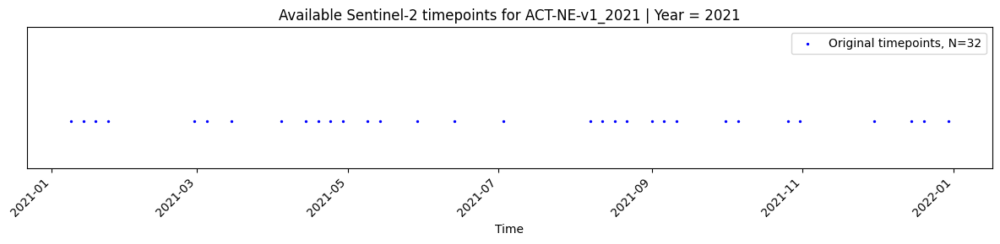

In [14]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert xarray time to pandas datetime for easier plotting
ds_time = pd.to_datetime(ds.time.values)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 3))

x_height = 3
# Plot original timepoints as scatter points

if resample_data:
    orig_height = x_height / 2
else:
    orig_height = x_height / 3

ax.scatter(ds_time, [orig_height] * len(ds_time), color='blue', s=2, label=(f'Original timepoints, N={len(ds_time)}'), zorder=2)

if resample_data:
    # Plot interpolated timepoints as a continuous line
    ds_weekly_time = pd.to_datetime(ds_weekly.time.values)
    ax.plot(ds_weekly_time, [x_height / 2] * len(ds_weekly_time), color='red', label=(f'Interpolated weekly timepoints, N={len(ds_weekly_time)}'), zorder=1)
    x_pos_for_raw_data = 0.6  #This sets the position of the resmapled data in the figure; if we didn't resample then we are only plotting the non-interpolated data
    ax.set_title(f'Comparison of Original and Interpolated timepoints (linear interpolation) | {stub} | {year}')
else:
    x_pos_for_raw_data =  0.5
    ax.set_title(f'Available Sentinel-2 timepoints for {stub} | Year = {year}')

# Customize the plot
ax.set_yticks([0,x_height])  # Remove y-axis ticks
ax.set_yticks([])  # Remove y-axis ticks
ax.set_xlabel('Time')
if year == None:
    year = "all-years"

ax.legend()

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(f"{outdir}Actual-vs-interpolated-Sentinel-data-for-{stub}_{year}.png")

plt.show()

del ds_time

In [15]:
# If desired, delete DS array to clear up memory:

delete_ds = False

if not(resample_data):
    print("Data was not resampled, so we make ds_weekly = ds")
    ds_weekly = ds

if delete_ds:
    print("Deleting DS array since it isn't used again and take up memory.", "\n")
    memory_in_use = return_memory_usage()
    print("Memory before deletion:", memory_in_use)
    
    del ds
    time.sleep(2)
    memory_in_use = return_memory_usage()
    print("Memory after deletion:", memory_in_use, "\n")

Data was not resampled, so we make ds_weekly = ds


In [10]:
ds_weekly.head()

<xarray.Dataset>
Dimensions:                     (time: 5, y: 5, x: 5)
Coordinates:
  * time                        (time) datetime64[ns] 2023-01-09T00:06:28.779...
  * y                           (y) float64 -4.216e+06 -4.216e+06 ... -4.216e+06
  * x                           (x) float64 1.439e+07 1.439e+07 ... 1.439e+07
    spatial_ref                 int32 6933
Data variables: (12/30)
    nbart_coastal_aerosol       (time, y, x) float32 376.0 376.0 ... 897.0 897.0
    nbart_blue                  (time, y, x) float32 280.0 411.0 ... 938.0 873.0
    nbart_green                 (time, y, x) float32 443.0 608.0 ... 1.104e+03
    nbart_red                   (time, y, x) float32 523.0 795.0 ... 1.157e+03
    nbart_red_edge_1            (time, y, x) float32 1.069e+03 ... 1.539e+03
    nbart_red_edge_2            (time, y, x) float32 1.806e+03 ... 2.453e+03
    ...                          ...
    oa_s2cloudless_prob         (time, y, x) float32 0.003689 ... 0.04987
    oa_nbart_contiguity         (time, y, x) uint8 1 1 1 1 1 1 1 ... 1 1 1 1 1 1
    oa_s2cloudless_mask         (time, y, x) uint8 1 1 1 1 1 1 1 ... 1 1 1 1 1 1
    NDVI                        (time, y, x) float32 0.6279 0.5261 ... 0.3123
    LAI                         (time, y, x) float32 1.08 1.003 ... 0.6363
    SAVI                        (time, y, x) float32 0.3389 0.3169 ... 0.1885
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref

### Run this code to export GEOTIFF files for specific indices

In [16]:
# NEW CODE WITH ALL INDICES

## --> IMPORTANT: this was just llm'd from the original index calculation code above and the outputs haven't been verified for accuracy

import xarray as xr
import numpy as np
from datetime import datetime
import rioxarray


# ------------------------------------------------------------
# Utility Functions
# ------------------------------------------------------------
def get_available_dates(ds):
    """Return list of available dates in the dataset."""
    return ds.time.values


def find_nearest_date(ds, target_date):
    """Find the nearest available date to the target date."""
    if isinstance(target_date, str):
        target_date = np.datetime64(target_date)
    elif isinstance(target_date, datetime):
        target_date = np.datetime64(target_date)
        
    available_dates = ds.time.values
    nearest_date = min(available_dates, key=lambda x: abs(x - target_date))
    return nearest_date


def export_to_geotiff(da, variable, output_path):
    """Export DataArray to GeoTIFF with proper spatial reference."""
        
    try:
        if 'spatial_ref' in da.coords:
            da.rio.write_crs(da.spatial_ref.attrs['spatial_ref'], inplace=True)
        
        da.rio.to_raster(output_path, driver='GTiff')
        print(f"Successfully exported {variable} to: {output_path}")
        
    except Exception as e:
        raise Exception(f"Error exporting to GeoTIFF: {e}")


# ------------------------------------------------------------
# Index Calculation Functions
# ------------------------------------------------------------
def calculate_ndyi(ds):
    """Normalized Difference Yellowness Index (NDYI)."""
    blue = ds.nbart_blue
    green = ds.nbart_green
    ndyi = (green - blue) / (green + blue)
    return ndyi

def calculate_ndyi2(ds):
    """Normalized Difference Yellowness Index 2 (NDYI2)."""
    red = ds.nbart_red
    green = ds.nbart_green
    ndvi = ds.NDVI
    ndyi2 = (red + green) / ndvi

    # Normalize between 0 and 1
    min_val = ndyi2.min()
    max_val = ndyi2.max()
    ndyi2_norm = (ndyi2 - min_val) / (max_val - min_val)
    return ndyi2_norm

def calculate_cfi3(ds):
    """Canola Flower Index 3 (CFI3)."""
    ndvi = ds.NDVI
    red = ds.nbart_red
    green = ds.nbart_green
    blue = ds.nbart_blue

    sum_red_green = red + green
    diff_green_blue = green - blue

    cfi3 = ndvi * (sum_red_green + diff_green_blue)
    return cfi3

def calculate_cfitb(ds):
    """Alternative Canola Flower Index (CFI_TB)."""
    red = ds.nbart_red
    green = ds.nbart_green
    blue = ds.nbart_blue
    ndvi = ds.NDVI

    cfi_tb = ndvi * ((red + green) + abs(red - blue))
    return cfi_tb

def calculate_hrfi(ds):
    """High-Resolution Flowering Index (HrFI)."""
    red = ds.nbart_red
    green = ds.nbart_green
    blue = ds.nbart_blue

    hrfi = (red - blue) * (green - blue)
    return hrfi

def calculate_nirv(ds):
    """Near-Infrared Reflectance of Vegetation (NIRv)."""
    ndvi = ds.NDVI
    nir = ds.nbart_nir_1
    nirv = ndvi * nir
    return nirv

def calculate_dnirv(ds):
    """Difference in NIRv between time steps."""
    nirv = calculate_nirv(ds)
    dnirv = nirv.diff(dim='time', n=1)
    return dnirv

def calculate_ndti(ds):
    """Normalized Difference Tillage Index (NDTI)."""
    swir1 = ds.nbart_swir_2
    swir2 = ds.nbart_swir_3
    ndti = (swir1 - swir2) / (swir1 + swir2)
    return ndti

def calculate_cai(ds):
    """Cellulose Absorption Index (CAI)."""
    swir1 = ds.nbart_swir_2
    swir2 = ds.nbart_swir_3
    nir = ds.nbart_nir_1

    cai = (0.5 * (swir1 + swir2)) - nir
    return cai

def calculate_ndri(ds):
    """Normalized Difference Redness Index (NDRI)."""
    swir2 = ds.nbart_swir_2
    nir1 = ds.nbart_nir_1
    ndri = (swir2 + nir1) / (swir2 - nir1)
    return ndri

def calculate_bsi(ds):
    """Bare Soil Index (BSI)."""
    red = ds.nbart_red
    swir2 = ds.nbart_swir_2
    nir1 = ds.nbart_nir_1
    blue = ds.nbart_blue

    bsi = ((red + swir2) - (nir1 + blue)) / ((red + swir2) + (nir1 + blue))
    return bsi

def calculate_ndsi(ds):
    """Normalized Difference Soil Index (NDSI)."""
    green = ds.nbart_green
    swir2 = ds.nbart_swir_2
    ndsi = (green - swir2) / (green + swir2)
    return ndsi

def calculate_savi(ds, L=0.5):
    """Soil-Adjusted Vegetation Index (SAVI)."""
    nir1 = ds.nbart_nir_1
    red = ds.nbart_red

    savi = ((nir1 - red) * (1 + L)) / (nir1 + red + L)
    return savi

def calculate_iron_oxide_index(ds):
    """Iron Oxide Index."""
    red = ds.nbart_red
    blue = ds.nbart_blue
    iron_oxide_index = (red - blue) / (red + blue)
    return iron_oxide_index

def calculate_nbr(ds):
    """Normalized Burn Ratio (NBR)."""
    nir1 = ds.nbart_nir_1
    swir2 = ds.nbart_swir_2

    nbr = (nir1 - swir2) / (nir1 + swir2)
    return nbr

def calculate_brightness_index(ds):
    """Brightness Index (BI)."""
    red = ds.nbart_red
    green = ds.nbart_green

    brightness_index = ((red**2 + green**2) ** 0.5)
    return brightness_index

def calculate_evi1(ds):
    """Enhanced Vegetation Index (EVI)."""
    nir1 = ds.nbart_nir_1
    red = ds.nbart_red
    blue = ds.nbart_blue

    evi = 2.5 * (nir1 - red) / ((nir1 + 6.0 * red - 7.5 * blue) + 1.0)
    return evi

def calculate_evi2(ds):
    """Enhanced Vegetation Index 2 (EVI2)."""
    nir1 = ds.nbart_nir_1
    red = ds.nbart_red

    evi2 = 2.4 * (nir1 - red) / (nir1 + red + 1.0)
    return evi2


# ------------------------------------------------------------
# Main Processing Workflow
# ------------------------------------------------------------
def get_variable(ds, date, variable):
    """Get or calculate the requested variable for a specific date."""
    ds_time = ds.sel(time=date)

    calculators = {
        'NDYI': calculate_ndyi,
        'NDYI2': calculate_ndyi2,
        'CFI3': calculate_cfi3,
        'CFITB': calculate_cfitb,
        'HRFI': calculate_hrfi,
        'NIRv': calculate_nirv,
        'dNIRv': calculate_dnirv,
        'NDTI': calculate_ndti,
        'CAI': calculate_cai,
        'NDRI': calculate_ndri,
        'BSI': calculate_bsi,
        'NDSI': calculate_ndsi,
        'SAVI': calculate_savi,
        'Iron_Oxide_Index': calculate_iron_oxide_index,
        'NBR': calculate_nbr,
        'Brightness_Index': calculate_brightness_index,
        'EVI1': calculate_evi1,
        'EVI2': calculate_evi2,
    }

    if variable in calculators:
        return calculators[variable](ds_time)
    elif variable in ds_time:
        return ds_time[variable]
    else:
        raise ValueError(f"Variable '{variable}' not found or cannot be calculated.")


def process_variables(ds_weekly, target_dates, variables, output_dir, stub, make_index_folder = False):
    """
    Process and export multiple variables for multiple dates with simplified filenames.
    
    Parameters:
    -----------
    ds_weekly : xarray.Dataset
        The input dataset containing the time-series data.
    target_dates : list of str
        List of target dates in 'YYYY-MM-DD' format.
    variables : list of str
        List of variable names to calculate or extract.
    output_dir : str
        Directory where the output GeoTIFFs will be saved.
    """
    import os

    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Loop through each date
    for target_date in target_dates:
        # Find the nearest available date
        nearest_date = find_nearest_date(ds_weekly, target_date)

        if nearest_date != np.datetime64(target_date):
            print(f"Using nearest available date: {nearest_date} (requested: {target_date})")

        # Convert nearest_date to 'YYYY-MM-DD' format
        formatted_date = str(nearest_date)[:10]

        for variable in variables:
            try:
                result = get_variable(ds_weekly, nearest_date, variable)
                if make_index_folder:
                    new_output_dir = output_dir + f'{variable}/'
                    os.makedirs(new_output_dir, exist_ok=True)
                    output_path = os.path.join(new_output_dir, f"{stub}_{variable}_{formatted_date}.tif")
                else:
                     output_path = os.path.join(output_dir, f"{stub}_{variable}_{formatted_date}.tif")

               

                # Export to GeoTIFF
                export_to_geotiff(result, variable, output_path)
            
            except Exception as e:
                print(f"Error processing variable '{variable}' for date '{formatted_date}': {e}")
                continue


In [17]:
# Get list of available dates
available_dates = get_available_dates(ds_weekly)
print("Available dates:", available_dates)

Available dates: ['2021-01-09T00:06:27.180211000' '2021-01-14T00:06:28.774264000'
 '2021-01-19T00:06:27.766693000' '2021-01-24T00:06:28.562153000'
 '2021-02-28T00:06:26.632081000' '2021-03-05T00:06:27.809893000'
 '2021-03-15T00:06:27.400300000' '2021-04-04T00:06:24.514704000'
 '2021-04-14T00:06:22.147748000' '2021-04-19T00:06:23.010075000'
 '2021-04-24T00:06:24.004521000' '2021-04-29T00:06:23.505400000'
 '2021-05-09T00:06:25.896393000' '2021-05-14T00:06:27.661442000'
 '2021-05-29T00:06:28.596744000' '2021-06-13T00:06:28.456596000'
 '2021-07-03T00:06:30.175668000' '2021-08-07T00:06:29.058446000'
 '2021-08-12T00:06:30.515414000' '2021-08-17T00:06:27.770075000'
 '2021-08-22T00:06:30.137960000' '2021-09-01T00:06:29.188570000'
 '2021-09-06T00:06:24.442421000' '2021-09-11T00:06:28.288949000'
 '2021-10-01T00:06:32.343807000' '2021-10-06T00:06:28.255826000'
 '2021-10-26T00:06:29.424182000' '2021-10-31T00:06:32.467258000'
 '2021-11-30T00:06:27.701567000' '2021-12-15T00:06:21.858062000'
 '2021-1

In [42]:
print("WARNING, this process outputs a lot of tifs when exporting all indices for all times.")

target_dates = ['2021-07-03', '2021-08-07'] 
# Use this to export all available dates:
target_dates = get_available_dates(ds_weekly)

# or pass just one or a few dates:
target_dates = ['2021-07-03', '2021-08-07'] 

index_names = ['NDVI', 'NDYI', 'NDYI2', 'NDRI', 'CFI3', 'CFITB', 'HRFI', 'EVI1', 'EVI2', 'NIRv', 'dNIRv', 'NDTI', 'CAI']#, 'BSI', 'NDSI', 'Iron_Oxide_Index', 'NBR', 'BI']
#index_names = ['NDVI', 'NDYI', 'CFI3'] 

output_dir = outdir + f'geotifs-exported/{stub}/'
make_index_folder = True # If TRUE, each set of indices will be put in its own folder

process_variables(ds_weekly, target_dates, index_names, output_dir, stub, make_index_folder)


Using nearest available date: 2021-07-03T00:06:30.175668000 (requested: 2021-07-03)
Successfully exported NDVI to: /g/data/xe2/tbb801/Data/PadSeg/geotifs-exported/ACT-NE-v1_2021/NDVI/ACT-NE-v1_2021_NDVI_2021-07-03.tif
Successfully exported NDYI to: /g/data/xe2/tbb801/Data/PadSeg/geotifs-exported/ACT-NE-v1_2021/NDYI/ACT-NE-v1_2021_NDYI_2021-07-03.tif
Successfully exported NDYI2 to: /g/data/xe2/tbb801/Data/PadSeg/geotifs-exported/ACT-NE-v1_2021/NDYI2/ACT-NE-v1_2021_NDYI2_2021-07-03.tif
Successfully exported NDRI to: /g/data/xe2/tbb801/Data/PadSeg/geotifs-exported/ACT-NE-v1_2021/NDRI/ACT-NE-v1_2021_NDRI_2021-07-03.tif
Successfully exported CFI3 to: /g/data/xe2/tbb801/Data/PadSeg/geotifs-exported/ACT-NE-v1_2021/CFI3/ACT-NE-v1_2021_CFI3_2021-07-03.tif
Successfully exported CFITB to: /g/data/xe2/tbb801/Data/PadSeg/geotifs-exported/ACT-NE-v1_2021/CFITB/ACT-NE-v1_2021_CFITB_2021-07-03.tif
Successfully exported HRFI to: /g/data/xe2/tbb801/Data/PadSeg/geotifs-exported/ACT-NE-v1_2021/HRFI/ACT-NE-

### View satellite data along with pad_man

In [18]:
import numpy as np
from ipyleaflet import Map, GeoData, ImageOverlay
from ipywidgets import Layout
import matplotlib.pyplot as plt
import io
import base64

gdf = pad_man2

# First ensure the satellite data is in EPSG:4326
satellite_data = ds_weekly.isel(time=1).nbart_green
if satellite_data.rio.crs != 'EPSG:4326':
    satellite_data = satellite_data.rio.reproject('EPSG:4326')

# Calculate center using bounds
bounds = gdf.total_bounds
center = ((bounds[1] + bounds[3])/2, (bounds[0] + bounds[2])/2)

# Create the base map
m = Map(
    center=center,
    zoom=10,
    basemap=basemaps.Esri.WorldImagery,
    layout=Layout(height='800px')
)

# Create a matplotlib figure of the satellite data
plt.figure(figsize=(10, 10))
satellite_data.plot(cmap='gray', alpha=0.5, add_colorbar=False)  # removed legend
plt.axis('off')

# Save the figure to a bytes buffer
buf = io.BytesIO()
plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
plt.close()
buf.seek(0)

# Encode the image
img_str = base64.b64encode(buf.read()).decode()

# Get the bounds for the image overlay
bounds = satellite_data.rio.bounds()
bounds_array = [[bounds[1], bounds[0]], [bounds[3], bounds[2]]]

# Create the image overlay
satellite_layer = ImageOverlay(
    url=f'data:image/png;base64,{img_str}',
    bounds=bounds_array,
    opacity=0.5
)
m.add_layer(satellite_layer)

#style={'color': 'yellow', 'fillOpacity': 1, 'weight': 3},

# Add your GeoDataFrame layer
gdf_layer = GeoData(
    geo_dataframe=gdf,
    style={'color': 'red', 
           'fillOpacity': 1, 
           'weight': 3,
           'radius': 8
    },
    name='Points'
)
m.add_layer(gdf_layer)

# Fit bounds
m.fit_bounds(bounds_array)

# Display the map
display(m)

Map(center=[-35.51551381018197, 149.15377535], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoo…

## Crop sentinel and site data and fix geometries

### Assure that pad_man CRS matches ds_weekly CRS
(if not, reproject pad_man to match ds_weekly)

In [19]:
print("ds_weekly CRS =", ds_weekly.rio.crs)
print("pad_man CRS =", pad_man.crs)

if ds_weekly.rio.crs != pad_man.crs:
    print('\n\033[1mWARNING "ds_weekly" and "pad_man" do not have the same CRS this must be fixed before continuing!\033[0m\n')


# Reproject if necessary
pad_man_reprojected = pad_man.to_crs(ds_weekly.rio.crs)

print("ds_weekly CRS =", ds_weekly.rio.crs)
print("pad_man CRS =", pad_man.crs)
print("pad_man_reprojected CRS =", pad_man_reprojected.crs)


ds_weekly CRS = EPSG:6933
pad_man CRS = EPSG:4326

WARNING "ds_weekly" and "pad_man" do not have the same CRS this must be fixed before continuing!

ds_weekly CRS = EPSG:6933
pad_man CRS = EPSG:4326
pad_man_reprojected CRS = PROJCS["WGS 84 / NSIDC EASE-Grid 2.0 Global",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Cylindrical_Equal_Area"],PARAMETER["standard_parallel_1",30],PARAMETER["central_meridian",0],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","6933"]]


#### Assure that pad_man extents are  within the bounds of the Sentinel data (ds_array)

pad_man_reprojected bounds: [14368504.29104016 -4293158.55565673 14414081.64675856 -4211879.66335423]


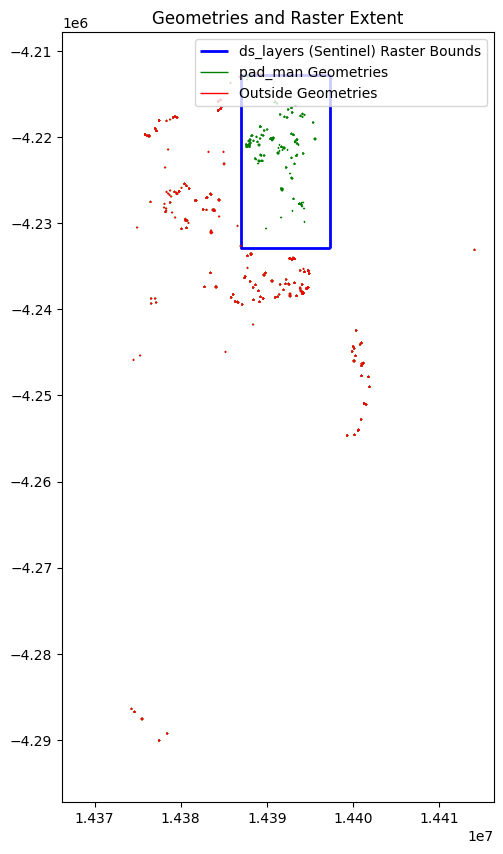

In [20]:
from shapely.geometry import box
import geopandas as gpd

def plot_satellite_and_data_extents(pad_man, ds_weekly, list_external_indices = False):

    # Get bounds of pad_man_reprojected
    pad_bounds = pad_man.total_bounds
    print("pad_man_reprojected bounds:", pad_bounds,)
    
    # Step 1: Get the bounds of ds_weekly
    ds_bounds = ds_weekly.rio.bounds()  # Returns (minx, miny, maxx, maxy)
    ds_extent = box(*ds_bounds)  # Create a shapely Polygon representing the raster bounds
    
    # Step 2: Check if pad_man's geometries are within ds_weekly's bounds
    
    # Create a GeoDataFrame containing the raster extent for spatial operations
    ds_extent_gdf = gpd.GeoDataFrame({'geometry': [ds_extent]}, crs=pad_man.crs)
    
    # Identify geometries that are not entirely within the raster extent
    outside_bounds = pad_man[~pad_man.geometry.within(ds_extent)]
    
    # Step 3: Warn the user if any geometries are outside the raster bounds
    if not outside_bounds.empty:
        num_outside = len(outside_bounds)
        total_geometries = len(outside_bounds)
        print(f"Warning: {num_outside} out of {total_geometries} geometries in 'pad_man' extend beyond 'ds_weekly's extent.")
        if list_external_indices: print("WARNING: Indices of geometries outside the raster bounds:", outside_bounds.index.tolist())
    else:
        print("All geometries in 'pad_man' are within the bounds of 'ds_weekly'.")
    
    import matplotlib.pyplot as plt
    
    
    # Plot the raster extent
    fig, ax = plt.subplots(figsize=(10, 10))
    
    ds_extent_gdf.boundary.plot(ax=ax, edgecolor='blue', linewidth=2, label='ds_layers (Sentinel) Raster Bounds')
    
    # Plot all geometries
    pad_man.boundary.plot(ax=ax, edgecolor='green', linewidth=1, label='pad_man Geometries')
    
    # Highlight geometries outside the raster bounds
    if not outside_bounds.empty:
        outside_bounds.boundary.plot(ax=ax, edgecolor='red', linewidth=1, label='Outside Geometries')
    
    plt.legend()
    plt.title('Geometries and Raster Extent')
    plt.show()

#example usage
plot_satellite_and_data_extents(pad_man_reprojected, ds_weekly, list_external_indices = False)



# If this looks good, replace pad_man with the reprojected version
if on_nci:
    pad_man_bak = pad_man #save a copy in case it is needed (don't do this on local due to RAM issues)
pad_man = pad_man_reprojected
del pad_man_reprojected

##### If needed, clip geometries to the raster extent
The code below will either crop the satellite data to the extent of the 'paddocks' array, or visa-versa. Default is to crop pad_man to satellite (ds_weekly)

In [21]:
import geopandas as gpd
import xarray as xr
from shapely.geometry import box

def crop_to_bounds(pad_man, ds_weekly, crop_option='crop_site_to_sentinel', padding=0):
    """
    Crop one geospatial dataset to another with padding.
    
    Parameters:
    -----------
    pad_man : GeoDataFrame
        The vector dataset
    ds_weekly : xarray.Dataset
        The raster dataset
    crop_option : str
        Either 'crop_site_to_sentinel' or 'crop_sentinel_to_site'
    padding : float
        Padding in coordinate units (e.g., degrees if using geographic coordinates)
        Default is 0.001 (approximately 100m at the equator if using degrees)
    """
    if padding==0:
        print("No padding value passed; data will be cropped without padding")
        
    # Get the bounds of the xarray dataset
    ds_bounds = ds_weekly.rio.bounds()  # Returns (minx, miny, maxx, maxy)
    
    if crop_option == 'crop_site_to_sentinel':
        # Add padding to make the extent slightly smaller
        ds_bounds_padded = (
            ds_bounds[0] + padding,  # minx + padding
            ds_bounds[1] + padding,  # miny + padding
            ds_bounds[2] - padding,  # maxx - padding
            ds_bounds[3] - padding   # maxy - padding
        )
        ds_extent = box(*ds_bounds_padded)
        
        # Create a GeoDataFrame containing the padded raster extent
        ds_extent_gdf = gpd.GeoDataFrame({'geometry': [ds_extent]}, crs=pad_man.crs)
        
        # Crop pad_man to ds_weekly's bounds
        pad_man_clipped = gpd.overlay(pad_man, ds_extent_gdf, how='intersection')
        return pad_man_clipped, ds_weekly

    elif crop_option == 'crop_sentinel_to_site':
        # Get the bounds of the pad_man GeoDataFrame
        pad_bounds = pad_man.total_bounds  # Returns (minx, miny, maxx, maxy)
        
        # Add padding to make the extent slightly smaller
        pad_bounds_padded = (
            pad_bounds[0] - padding,  # minx - padding
            pad_bounds[1] - padding,  # miny - padding
            pad_bounds[2] + padding,  # maxx + padding
            pad_bounds[3] + padding   # maxy + padding
        )
        
        # Crop ds_weekly to pad_man's bounds with padding
        ds_weekly_cropped = ds_weekly.rio.clip_box(*pad_bounds_padded)
        return pad_man, ds_weekly_cropped

    else:
        raise ValueError("Invalid crop_option. Choose 'crop_site_to_sentinel' or 'crop_sentinel_to_site'.")

#### In the next cell, select if you want to crop the bounds of the site data to the sentinel bounds or via versa
* If you need to crop in both directions, crop_to_bounds multiple times in a row (ie 'crop_site_to_sentinel' and then 'crop_sentinel_to_site')

No padding value passed; data will be cropped without padding
No padding value passed; data will be cropped without padding
pad_man_reprojected bounds: [14387081.36384592 -4231539.62648503 14395906.89279556 -4212840.791438  ]
All geometries in 'pad_man' are within the bounds of 'ds_weekly'.


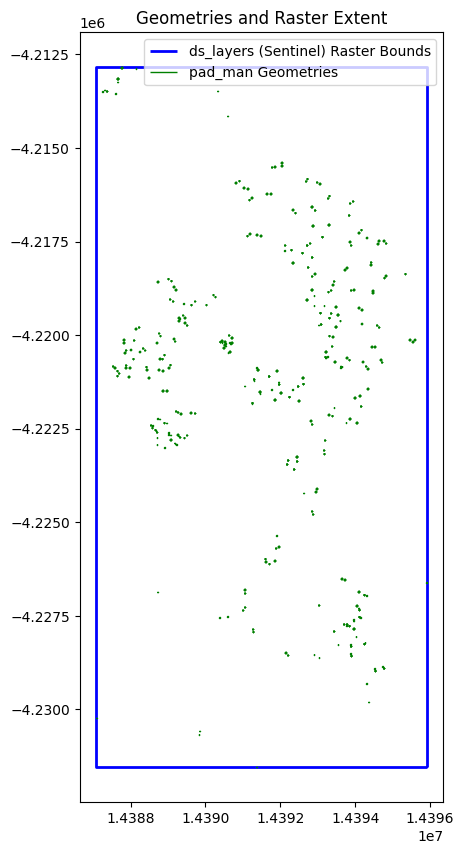

Once data is cropped (eg 'site to sentinel', if you need to then repeat the crop in the opposite direction (eg 'sentinel to site')/n
Make sure you run the next cell below first to complete the crop, before running it again


In [22]:
# Usage

padding_amount = 0.0006 # This is in degrees, use the meters_to_degrees function to determine what the buffer is in meters
padding_amount = 0


if on_nci:
    pad_man, ds_weekl = crop_to_bounds(pad_man, ds_weekly, crop_option='crop_site_to_sentinel', padding=padding_amount)
    pad_man, ds_weekly = crop_to_bounds(pad_man, ds_weekly, crop_option='crop_sentinel_to_site', padding=padding_amount)
    plot_satellite_and_data_extents(pad_man, ds_weekly)
else: #If not on NCI, do the crop directly to save RAM (this is not reversable)
    pad_man, ds_weekly = crop_to_bounds(pad_man, ds_weekly, crop_option='crop_site_to_sentinel')
    plot_satellite_and_data_extents(pad_man, ds_weekly)

print("Once data is cropped (eg 'site to sentinel', if you need to then repeat the crop in the opposite direction (eg 'sentinel to site')/n")
print("Make sure you run the next cell below first to complete the crop, before running it again")

###### Identify invalid geometries (again)

Memory Usage: 27.92 GB / 251.19 GB
No invalid geometries found
done


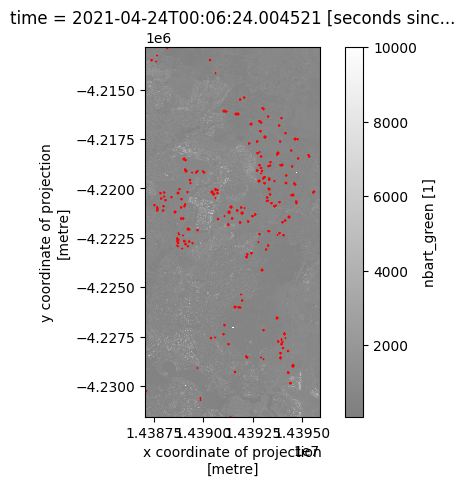

In [23]:
return_memory_usage()
# Identify invalid geometries
invalid = ~pad_man.is_valid
if invalid.any():
    print(f"Found {invalid.sum()} invalid geometries after reprojection. Fixing them.")
    # Attempt to fix invalid geometries
    pad_man['geometry'] = pad_man['geometry'].buffer(0)
    print(invalid)
else:
    print('No invalid geometries found')

# View pad_man data along with the satellite data
print("done")
import matplotlib.pyplot as plt
#print(ds_weekly.data_vars)

# Plot the raster data
ds_weekly.isel(time=10).nbart_green.plot.imshow(cmap='gray', alpha=0.5)

# Plot the reprojected geometries
pad_man.boundary.plot(edgecolor='red', linewidth=1, ax=plt.gca())


plt.show()

# Validate geometries
## NOT SURE IF THIS IS NEEDED
pad_man['geometry'] = pad_man['geometry'].buffer(20)


## Full Paddocks x variable x time
- clustering using heirachical clustering and/or time series clustering
- make interactive heat map to hover over labels (single variable)
- make interactive pairwise dissimilarity matrix (multi variable)
- dimensionality reduction plot (k-means? tSNE?), also interactive. 

#### Process geometry
(updated to handle rows that return no data)

In [24]:
def process_geometry(datarow, ds, id_column):
    import rioxarray
    try:
        # Attempt to clip the dataset to the paddock geometry
        ds_clipped = ds.rio.clip([datarow.geometry])

        # Extract the median band value, ignoring zero values
        pol_ts = ds_clipped.where(ds_clipped > 0).median(dim=['x', 'y'])
        array = pol_ts.to_array().transpose('variable', 'time').values.astype(np.float32)

        # Return the paddock ID and the data array
        return getattr(datarow, id_column), array[None, :]
    except Exception as e:
        # Log the error and return None for the result
        #print(f"Error processing geometry with ID {getattr(datarow, id_column)}: {e}")
        return getattr(datarow, id_column), array[None, None]


id_column = 'paddock' # This should be a column name with unique ID for each row

# # Call process_geometry one row at a time:
# datarow = pad_man.iloc[7]  # Remember that indexing starts from 0
# result = process_geometry(datarow, ds_weekly, id_column)
# print(result)

# Define a helper function that wraps the try-except logic
def process_with_error_handling(datarow, ds, id_column):
    try:
        return process_geometry(datarow, ds, id_column)
    except Exception as e:
        # Log the error and return a tuple with the ID and None
        return getattr(datarow, id_column), None


# Use parallel processing and apply the helper function to handle errors
results = Parallel(n_jobs=-1)(
    delayed(process_with_error_handling)(datarow, ds_weekly, id_column)
    for datarow in tqdm(pad_man.itertuples(index=False), total=len(pad_man))
)

# List the paddock IDs for rows that returned None
skipped_rows = [result[0] for result in results if result[1] is None]

# Print the skipped paddock IDs
print("Rows that returned None (skipped paddock IDs):")
print(skipped_rows)

# Filter out any None values before combining results
valid_results = [res for res in results if res[1] is not None]

#extract the ID's of the valid and invalid results
valid_ids = [res[0] for res in valid_results]
invalid_ids = [res[0] for res in results if res[1] is None]

# Combine the valid results into a single numpy array (Paddock Variable Time array)
if valid_results:
    pvt = np.vstack([res[1] for res in valid_results])
    print("Processing complete")
else:
    print("No valid results to combine")

print("'pad_man shape' is:",pad_man.shape, "| 'pvt shape' is", pvt.shape)
print(len(pad_man)- len(pvt), 'rows were dropped')
#print(pvt)

# Use this to see what is wrong with the data in the row that was skipped

if len(invalid_ids) > 0:
    rows = pad_man.loc[pad_man['paddock'].isin(invalid_ids)]
    print(rows)

else:
    print("No invalid rows detected")
#rows = pad_man.loc[pad_man['paddock'].isin(valid_ids)]



100%|██████████| 1350/1350 [03:45<00:00,  6.00it/s]


Rows that returned None (skipped paddock IDs):
[]
Processing complete
'pad_man shape' is: (1350, 127) | 'pvt shape' is (1350, 30, 32)
0 rows were dropped
No invalid rows detected


### Create paddocks array 
* Uses *pad_man* (geopandas) array, *pvt* (np.ndarray from previous step) and *ds_weekly* (sentinel data xarray)
* Modified to handle missing data

In [19]:
def create_paddock_xarray(pol, pvt_array, ds, valid_ids, id_column='paddock'):
    # Filter pol to include only paddocks with valid data
    pol_filtered = pol[pol[id_column].isin(valid_ids)].reset_index(drop=True)
    
    # Extract time axis from the xarray Dataset
    time_axis = ds.time

    # Get variable names (bands)
    var_names = list(ds.data_vars.keys())

    # Create a DataArray for the paddock geometries
    geometry_da = xr.DataArray(pol_filtered.geometry.values, dims=["paddock"], name="geometry")

    attribute_das = {}
    for column in pol_filtered.columns:
        if column != 'geometry':
            attribute_das[column] = xr.DataArray(pol_filtered[column].values, dims=["paddock"], name=column)

    # Create DataArray for each band over time
    pvt_da = xr.DataArray(
        pvt_array,
        dims=["paddock", "variable", "time"],
        coords={
            "paddock": pol_filtered.paddock.values,
            "variable": var_names,
            "time": time_axis
        },
        name="pvt"
    )

    # Combine into a single Dataset
    ds_paddocks = xr.Dataset({
        "geometry": geometry_da,
        # "name": name_da,
        # "type": type_da,
        "pvt": pvt_da,
        **attribute_das  # Unpack all other attribute DataArrays
    })

    return ds_paddocks

### Now calculate all the indices
ds_weekly_paddocks = create_paddock_xarray(pad_man, pvt, ds_weekly, valid_ids)
ds_weekly_paddocks = calculate_indices(ds_weekly_paddocks, indices)


NDYI has shape:  (2648, 31)
NDYI2 has shape:  (2648, 31)
NDRI has shape:  (2648, 31)
CFI3 has shape:  (2648, 31)
CFITB has shape:  (2648, 31)
HRFI has shape:  (2648, 31)
NIRv has shape:  (2648, 31)
dNIRv has shape:  (2648, 30)
NDTI has shape:  (2648, 31)
CAI has shape:  (2648, 31)
BSI has shape:  (2648, 31)
NDSI has shape:  (2648, 31)
SAVI has shape:  (2648, 31)
Iron_Oxide_Index has shape:  (2648, 31)
NBR has shape:  (2648, 31)
BI has shape:  (2648, 31)
EVI1 has shape:  (2648, 31)
EVI2 has shape:  (2648, 31)


In [26]:
#ds_weekly_paddocks.head
#name_da
ds_weekly_paddocks.head(3)

<xarray.Dataset>
Dimensions:                             (paddock: 3, time: 3, variable: 3)
Coordinates:
  * paddock                             (paddock) int64 1 2 3
  * time                                (time) datetime64[ns] 2023-01-09T00:0...
  * variable                            (variable) object 'nbart_coastal_aero...
Data variables: (12/25)
    pvt                                 (paddock, variable, time) float64 370...
    geometry                            (paddock) object POLYGON ((14392592.9...
    objectid                            (paddock) int64 27 28 30
    globalid                            (paddock) object '{4247e1b2-716a-44b0...
    name                                (paddock) object 'JW_20_NW' ... 'JW_1...
    pctzone_1                           (paddock) object '1.3' '1.3' '1.3'
    ...                                  ...
    chilean_needle_grass_plants_per_ha  (paddock) float64 0.0 0.0 0.0
    blackberry_plants_per_ha            (paddock) float64 0.0 0.0 0.0
    saffron_thistle_plants_per_ha       (paddock) float64 9.541e+03 0.0 0.0
    pattersons_curse_plants_per_ha      (paddock) float64 14.13 0.0 0.0
    verbascum_plants_per_ha             (paddock) float64 nan nan nan
    survey_area                         (paddock) int64 400 400 400

##### *Misc reporting*

In [ ]:
## Report some info  stats about the dataset
def return_info(dataframe):    
    import io
    buffer = io.StringIO()
    dataframe.info(buf=buffer)
    lines = buffer.getvalue().splitlines()
    df_info = (pd.DataFrame([x.split() for x in lines[5:-2]], columns=lines[3].split())
           .drop('Count',axis=1)
           .rename(columns={'Non-Null':'Non-Null Count'}))
    print (df_info)
    return df_info

In [ ]:
#print("Pad_man =",(pad_man.type))
#print((ds_weekly.info))
#print("ds_weekly=", type(ds_weekly.info))
print("pvt", np.info(pvt))

### Start of analysis


Code below here needs additional work before re-use...

### Start plotting

In [68]:
print(indices)
ds_weekly_paddocks.head(2)

{'NDYI': <function calculate_ndyi at 0x145a83e885e0>, 'NDYI2': <function calculate_ndyi2 at 0x145a885739c0>, 'NDRI': <function calculate_ndri at 0x145a88573240>, 'CFI3': <function calculate_cfi3 at 0x145a88573100>, 'NIRv': <function calculate_nirv at 0x145a885719e0>, 'dNIRv': <function calculate_dnirv at 0x145a88572d40>, 'NDTI': <function calculate_ndti at 0x145a88572f20>, 'CAI': <function calculate_cai at 0x145a88573920>, 'BSI': <function calculate_bsi at 0x145a88572de0>, 'NDSI': <function calculate_ndsi at 0x145a885725c0>, 'SAVI': <function calculate_savi at 0x145a88573a60>, 'Iron_Oxide_Index': <function calculate_iron_oxide_index at 0x145a88571a80>, 'NBR': <function calculate_nbr at 0x145a88573f60>, 'BI': <function calculate_brightness_index at 0x145a88572a20>, 'EVI1': <function calculate_evi1 at 0x145a885727a0>, 'EVI2': <function calculate_evi2 at 0x145a88572ac0>}


<xarray.Dataset>
Dimensions:                             (paddock: 2, time: 2, variable: 2)
Coordinates:
  * paddock                             (paddock) int64 1 2
  * time                                (time) datetime64[ns] 2023-01-09T00:0...
  * variable                            (variable) object 'nbart_coastal_aero...
Data variables: (12/25)
    pvt                                 (paddock, variable, time) float64 335...
    geometry                            (paddock) object POLYGON ((14389360.4...
    objectid                            (paddock) int64 6 7
    globalid                            (paddock) object '{e575c58f-010e-482d...
    sitecode                            (paddock) object 'Mul_11_NW' 'Mul_14_C'
    pctzone_1                           (paddock) object '1.1' '1.4'
    ...                                  ...
    chilean_needle_grass_plants_per_ha  (paddock) float64 0.0 9.541e+03
    blackberry_plants_per_ha            (paddock) float64 0.0 0.0
    saffron_thistle_plants_per_ha       (paddock) float64 0.0 0.0
    pattersons_curse_plants_per_ha      (paddock) float64 0.0 0.0
    verbascum_plants_per_ha             (paddock) float64 nan nan
    survey_area                         (paddock) int64 400 400

In [28]:
def plot_clustermap1(ds_paddocks, variable_name, year=None, filename_path=None):
    '''
    If filepath and stub name are passed then the file will be saved
    '''
    # Check if the variable_name exists in the dataset
    if variable_name not in ds_paddocks.variable.values:
        raise ValueError(f"Variable '{variable_name}' not found in the dataset.")
    
    # Extract the time series for the specified variable for all paddocks
    pt_variable = ds_paddocks.sel(variable=variable_name).pvt.values
    
    # Extract the timestamps and convert to Pandas DatetimeIndex
    time_stamps = ds_paddocks.time.values
    time_index = pd.to_datetime(time_stamps)
    
    # Filter the data for the specified year, if provided
    if year is not None:
        year_mask = time_index.year == year
        pt_variable = pt_variable[:, year_mask]
        time_index = time_index[year_mask]
    
    # Interpolate missing values along the time axis (2nd axis)
    pt_variable = np.apply_along_axis(
        lambda x: pd.Series(x).interpolate(method='linear', limit_direction='both').to_numpy(), 
        axis=1, 
        arr=pt_variable
    )

    print(pt_variable.shape)
    # Count NaN values
    nan_count = np.sum(np.isnan(pt_variable))
    print(f"Number of NaN values: {nan_count}")
    print("replacing nans with 0, for now, so the clustering can work..")
    pt_variable = np.nan_to_num(pt_variable, nan=0)

    # Adjust start date to include January if necessary
    start_date = time_index.min()
    if start_date.month != 1:
        start_date = pd.Timestamp(year=start_date.year, month=1, day=1)
    
    # Ensure January is included in monthly_start
    monthly_start = pd.date_range(start=start_date, end=time_index.max(), freq='MS')

    # Find the closest previous timestamps in the original time_index
    monthly_ticks = []
    for date in monthly_start:
        prior_dates = time_index[time_index <= date]
        if not prior_dates.empty:
            monthly_ticks.append(prior_dates[-1])

    monthly_ticks_str = [str(t)[:10] for t in monthly_ticks]

    # Extract paddock IDs for row names
    row_names = ds_paddocks.name.values

    # Extract species types and create a color mapping
    species_types = ds_paddocks.type.values
    unique_types = np.unique(species_types)
    palette = sns.color_palette("hsv", len(unique_types))
    type_color_map = {species: palette[i] for i, species in enumerate(unique_types)}
    species_colors = np.array([type_color_map[species] for species in species_types])

    # Plot heatmap with clustering of the rows
    g = sns.clustermap(pt_variable, metric='euclidean', method='average', 
                       row_cluster=True, col_cluster=False, cmap='viridis',
                       row_colors=species_colors, figsize=(14, 12))

    # Get the order of the rows after clustering
    row_order = g.dendrogram_row.reordered_ind

    # Reorder the row names and colors according to the clustering
    ordered_row_names = [row_names[i] for i in row_order]
    ordered_species_colors = [species_colors[i] for i in row_order]

    # Customize the plot
    g.ax_heatmap.set_xlabel('Time')

    # Set the x-tick labels to the closest previous valid timestamp of each month
    tick_positions = [time_index.get_loc(t) for t in monthly_ticks]
    g.ax_heatmap.set_xticks(tick_positions)
    g.ax_heatmap.set_xticklabels(monthly_ticks_str, rotation=40, ha='right')
    
    # Set the y-tick labels to the ordered paddock IDs
    g.ax_heatmap.set_yticks(np.arange(len(ordered_row_names)) + 0.5)
    g.ax_heatmap.set_yticklabels(ordered_row_names, rotation=0)
    
    # Use plt.setp to adjust the font size for both axes
    plt.setp(g.ax_heatmap.get_xticklabels(), fontsize=4)  # Adjust x-tick font size
    plt.setp(g.ax_heatmap.get_yticklabels(), fontsize=3)  # Adjust y-tick font size

    years = np.unique(time_index.year)
    
    # Initialize lists to store the tick positions for Spring (Sept 1) and Autumn (Mar 1)
    spring_ticks = []
    autumn_ticks = []
    
    # Loop through each year and find the index positions for September 1 and March 1
    for year in years:
        # Find September 1st and March 1st for each year
        spring_start = pd.Timestamp(year=year, month=9, day=1)
        autumn_start = pd.Timestamp(year=year, month=3, day=1)
        
        # Check if these dates are within the time_index and get the closest matching index positions
        if spring_start in time_index:
            spring_ticks.append(time_index.get_loc(spring_start))
        else:
            # Find the closest date before or equal to September 1st
            prior_dates = time_index[time_index <= spring_start]
            if not prior_dates.empty:
                spring_ticks.append(time_index.get_loc(prior_dates[-1]))
    
        if autumn_start in time_index:
            autumn_ticks.append(time_index.get_loc(autumn_start))
        else:
            # Find the closest date before or equal to March 1st
            prior_dates = time_index[time_index <= autumn_start]
            if not prior_dates.empty:
                autumn_ticks.append(time_index.get_loc(prior_dates[-1]))
    
    # Add vertical lines for all Spring (September 1) and Autumn (March 1) instances across the years
    for tick in spring_ticks:
        g.ax_heatmap.axvline(x=tick, color='red', linestyle='--', linewidth=1.5, label='Sept 1' if tick == spring_ticks[0] else "")
    
    for tick in autumn_ticks:
        g.ax_heatmap.axvline(x=tick, color='blue', linestyle='--', linewidth=1.5, label='Mar 1' if tick == autumn_ticks[0] else "")
    
    # Optionally, add a legend to identify the lines (only one label per season)
    g.ax_heatmap.legend(loc='upper right')

    # Customize the color bar and position it to the right
    g.cax.set_position([1.05, 0.2, 0.03, 0.45])  # [left, bottom, width, height]
    g.cax.set_title(variable_name, pad=10)  # Title above the color bar

    # Delete y labels since they are too small to read anyway:
    g.ax_heatmap.set_yticklabels([])
    
    # Create species legend
    legend_handles = [mpatches.Patch(color=palette[i], label=species) 
                      for i, species in enumerate(unique_types)]
    
    # Add the legend to the plot
    plt.legend(handles=legend_handles, title='Class', bbox_to_anchor=(1.05, 1.4), loc='upper left')

    # Print the number of missing pixels across all time series for the variable
    print(f'Number of missing pixels across all {variable_name} time series:', np.count_nonzero(np.isnan(pt_variable)))
    
    # Save the plot to results
    if (filename_path != None):
        plt.savefig(f"{filename_path}_{variable_name}.png", bbox_inches='tight')
        print("\nFile saved to", filename_path + f"_{variable_name}.png\n")
    else:
        print("\nFile not saved. To save file, pass 'filename_path' to function.\n")

    plt.show()

In [ ]:
# Example usage:

# Uncomment to plot a subset of the classifications
# ds_weekly_paddocks_filtered_temp = ds_weekly_paddocks.where(
#     ds_weekly_paddocks['type'].isin(['exotic', 'mixed-high']),
#     drop=True
# )

index_names = ['CAI', 'NDVI', 'NIRv', 'dNIRv', 'CFI3', 'NDTI2', 'NDYI', 'NDYI2']

save_outputs = False
year = None
print(outdir)

if on_nci:
    if year == None:
        year = "All_Years"
    output_filename_path = outdir  + stub + "/" + str(year) + "/" + stub + "_"+str(year)+ '_all-classes_heatmap_dendro_'
else:
    ds_weekly_paddocks_savename = Path(desktop_dir + '\\'+outdir + stub+'_ds_weekly_paddocks_'+str(year)+'_v2_w-quality_Exotic_Mixed-low_only_v1.pkl' ) #<- use full path; not sure why relative paths don't work on desktop
    output_filename_path = Path(desktop_dir + '\\'+outdir + stub+"_"+str(year)+ '_all-classes_v1_heatmap_dendro_Exotic_Mixed-low_only_v1_')


if year == "All_Years":
    year = None

for index in index_names:
    if save_outputs:
        plot_clustermap1(ds_paddocks=ds_weekly_paddocks, variable_name=index, year=year, filename_path=output_filename_path)
    else:
        plot_clustermap1(ds_paddocks=ds_weekly_paddocks, year=year, variable_name=index) #, filename_path=output_filename_path)


#del ds_weekly_paddocks_filtered_temp


In [ ]:
ds_weekly_paddocks_filtered_temp = ds_weekly_paddocks.where(
    ds_weekly_paddocks['type'].isin(['exotic', 'mixed-high']),
    drop=True
)

#### Split dataset by type and then plot mean and other stats on each type as Timeseries

In [27]:
# Select a specific variable and convert to DataFrame to save out to a csv for exgternal analysis
band = 'CAI'


# Convert the xarray Dataset to a pandas DataFrame
df = ds_weekly_paddocks['pvt'].sel(variable=band).to_dataframe().reset_index()
df['time'] = pd.to_datetime(df['time'], format='%d/%m/%Y')
df['time'] = df['time'].dt.strftime('%Y_%m_%d')
df

,paddock,time,variable,pvt
0,1,2017_01_15,CAI,-787.00
1,1,2017_02_24,CAI,-461.50
2,1,2017_03_06,CAI,-250.50
3,1,2017_03_26,CAI,-82.75
4,1,2017_06_24,CAI,-107.50
...,...,...,...,...
135403,624,2024_08_11,CAI,23.00
135404,624,2024_08_26,CAI,NaN
135405,624,2024_08_31,CAI,127.00
135406,624,2024_09_05,CAI,152.00


##### Code to export datasets as SHP or CSV for external analysis

## Exploring continuous variables:

---

### Compare variables and indices

#### Filter by year if needed:

In [22]:
# Create mask as DataArray
year_to_filter = 2021
print("Filtering by year =", year_to_filter)

mask = xr.DataArray([str(d).startswith(str(year_to_filter)) for d in ds_weekly_paddocks.date.values], 
                    dims=ds_weekly_paddocks.date.dims,
                    coords=ds_weekly_paddocks.date.coords)

# Apply mask
ds_filtered = ds_weekly_paddocks.where(mask, drop=True)

# To see available years:
print("Available years in ground sampling data:")
unique_years = np.unique([str(d)[:4] for d in ds_weekly_paddocks.date.values])
print(unique_years)
# Print sizes
print("Original dataset size:", ds_weekly_paddocks.sizes)
print("Filtered dataset size:", ds_filtered.sizes)

# Calculate rows dropped
rows_dropped = ds_weekly_paddocks.sizes['paddock'] - ds_filtered.sizes['paddock']
print(f"Number of rows dropped: {rows_dropped}")
print(f"Percentage of data retained: {(ds_filtered.sizes['paddock']/ds_weekly_paddocks.sizes['paddock']*100):.1f}%")

Filtering by year = 2021
Available years in date variable:
['2018' '2019' '2020' '2021' '2022' '2023' 'None']
Original dataset size: Frozen({'paddock': 1223, 'time': 32, 'variable': 48})
Filtered dataset size: Frozen({'paddock': 228, 'variable': 48, 'time': 32})
Number of rows dropped: 995
Percentage of data retained: 18.6%


In [83]:
ds_filtered.head()

<xarray.Dataset>
Dimensions:                             (paddock: 5, variable: 5, time: 5)
Coordinates:
  * paddock                             (paddock) int64 2697 2702 2703 2704 2705
  * time                                (time) datetime64[ns] 2023-01-09T00:0...
  * variable                            (variable) object 'nbart_coastal_aero...
Data variables: (12/25)
    pvt                                 (paddock, variable, time) float64 255...
    geometry                            (paddock) object POLYGON ((14392743.1...
    objectid                            (paddock) float64 3.321e+03 ... 3.341...
    globalid                            (paddock) object '{b3e33069-7963-4d35...
    name                                (paddock) object 'CP03_old' ... 'NW_1...
    pctzone_1                           (paddock) object '16.1.1' ... '16.4.4'
    ...                                  ...
    chilean_needle_grass_plants_per_ha  (paddock) float64 0.0 0.0 0.0 0.0 0.0
    blackberry_plants_per_ha            (paddock) float64 0.0 0.0 0.0 0.0 0.0
    saffron_thistle_plants_per_ha       (paddock) float64 0.0 79.18 ... 153.9
    pattersons_curse_plants_per_ha      (paddock) float64 0.0 0.0 0.0 0.0 38.47
    verbascum_plants_per_ha             (paddock) float64 0.0 0.0 0.0 0.0 0.0
    survey_area                         (paddock) float64 400.0 400.0 ... 400.0

#### This code adapated to work with the ACT WEEDS dataset and forb diversity data

Bin plants_per_ha into 4 bins each by density
Also split the 'nativeforbdiversity' column into numeric categories so they can also be plotted

In [23]:
def create_density_bins(da):
    """
    Create density bins for plant counts per hectare
    Bin 1: 0-2500 plants/ha
    Bin 2: 2500-5000 plants/ha
    Bin 3: 5000-7500 plants/ha
    Bin 4: 7500-10000 plants/ha
    """
    bins = [0, 2500, 5000, 7500, 10000]
    return np.digitize(da, bins[1:]) + 1

# List of  variables to bin
plant_vars = [
    'st_johns_wort_plants_per_ha',
    'serrated_tussock_plants_per_ha',
    'african_love_grass_plants_per_ha',
    'chilean_needle_grass_plants_per_ha',
    'blackberry_plants_per_ha',
    'saffron_thistle_plants_per_ha',
    'pattersons_curse_plants_per_ha',
    'verbascum_plants_per_ha'
]

def bin_data(var, ds):

    # Create binned versions for each variable
    for var in plant_vars:
        if var in ds_filtered:  # Only process if variable exists in dataset
            binned_var = f"{var}_binned"
            ds_filtered[binned_var] = xr.apply_ufunc(
                create_density_bins,
                ds_filtered[var],
                input_core_dims=[[]],
                output_core_dims=[[]],
                vectorize=True,
                dask='allowed'
            )
            print(f"\nProcessed {var}")
            print(f"Unique bins in {binned_var}:", np.unique(ds_filtered[binned_var]))
    
    # Verify the new variables are in the dataset
    print("\nNew binned variables added to dataset:")
    for var in ds_filtered.variables:
        if var.endswith('_binned'):
            print(var)

    return ds_filtered


ds_filtered = bin_data(ds_filtered, plant_vars)


Processed st_johns_wort_plants_per_ha
Unique bins in st_johns_wort_plants_per_ha_binned: [1 2 3 4]

Processed serrated_tussock_plants_per_ha
Unique bins in serrated_tussock_plants_per_ha_binned: [1 2 4]

Processed african_love_grass_plants_per_ha
Unique bins in african_love_grass_plants_per_ha_binned: [1 2]

Processed chilean_needle_grass_plants_per_ha
Unique bins in chilean_needle_grass_plants_per_ha_binned: [1 2 4]

Processed blackberry_plants_per_ha
Unique bins in blackberry_plants_per_ha_binned: [5]

Processed saffron_thistle_plants_per_ha
Unique bins in saffron_thistle_plants_per_ha_binned: [1]

Processed pattersons_curse_plants_per_ha
Unique bins in pattersons_curse_plants_per_ha_binned: [1 2 3 4]

Processed verbascum_plants_per_ha
Unique bins in verbascum_plants_per_ha_binned: [1 5]

New binned variables added to dataset:
st_johns_wort_plants_per_ha_binned
serrated_tussock_plants_per_ha_binned
african_love_grass_plants_per_ha_binned
chilean_needle_grass_plants_per_ha_binned
bla

/g/data/xe2/John/geospatenv/lib/python3.11/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: invalid value encountered in create_density_bins (vectorized)
  outputs = ufunc(*inputs)


In [24]:
# First, let's see what we actually have in the data
unique_categories = np.unique(ds_filtered['nativeforbdiversity'])
print("Unique categories found:")
print(unique_categories)

Unique categories found:
['High Diversity' 'Low Diversity' 'Mod-High Diversity'
 'Moderate Diversity']


In [25]:
# First, identify and report non-string values
def is_valid_string(x):
    return isinstance(x, str) and x != '0'

# Get all unique values and report what's being dropped
unique_categories = np.unique(ds_filtered['nativeforbdiversity'])
dropped_values = [val for val in unique_categories if not is_valid_string(val)]
if dropped_values:
    print("Dropping the following non-string values:")
    for val in dropped_values:
        print(f"- {val}")

# Create mapping only for valid string values
valid_categories = np.array([val for val in unique_categories if is_valid_string(val)])
category_to_bin = {cat: i+1 for i, cat in enumerate(sorted(valid_categories))}

# Print the mapping
print("\nCategory to Bin Mapping:")
for cat, bin_num in category_to_bin.items():
    print(f"Bin {bin_num} = {cat}")

# Function to look up bin number for each value
def get_bin_number(x):
    return category_to_bin.get(x, 0) if is_valid_string(x) else 0

# Apply the mapping to create binned column
ds_filtered['nativeforbdiversity_binned'] = xr.apply_ufunc(
    get_bin_number,
    ds_filtered['nativeforbdiversity'],
    vectorize=True,
    dask='allowed'
)

# Verify results
print("\nUnique bins created:", np.unique(ds_filtered['nativeforbdiversity_binned']))


Category to Bin Mapping:
Bin 1 = High Diversity
Bin 2 = Low Diversity
Bin 3 = Mod-High Diversity
Bin 4 = Moderate Diversity

Unique bins created: [1 2 3 4]


In [26]:
# First, let's see all values including any NaN or zeros
print("All unique values in nativeforbdiversity (including NaN/zeros):")
print(np.unique(ds_filtered['nativeforbdiversity'].values))

# Then check what got assigned to bin 0
mask = ds_filtered['nativeforbdiversity_binned'] == 0
zero_bin_values = ds_filtered['nativeforbdiversity'].where(mask)
print("\nValues that got assigned to bin 0:")
print(np.unique(zero_bin_values.values[~pd.isnull(zero_bin_values.values)]))

All unique values in nativeforbdiversity (including NaN/zeros):
['High Diversity' 'Low Diversity' 'Mod-High Diversity'
 'Moderate Diversity']

Values that got assigned to bin 0:
[]


### Use this version of the code for plotting binned values:

In [28]:
import matplotlib.dates as mdates
from matplotlib.ticker import MultipleLocator, MaxNLocator

def compare_variables_index2(ds, variables, index_name='NDVI', bins_to_plot=[1,2,3,4], error_type='SE', 
                          min_grass_cover=0.2, include_pvalue_plots=True, 
                          print_stats_summary=False, output_filepath=None, display_vars=""):
    """
    Modified to plot separate lines for each bin (1-4) with different colors per variable
    error_type: 'SE' for Standard Error or 'CI' for 95% Confidence Interval
    """
    from scipy import stats
    import pandas as pd
    import numpy as np
    from itertools import combinations

    def calculate_error(std, n, error_type='SE'):
        """Calculate error bars based on specified type"""
        if error_type == 'SE':
            return std / np.sqrt(n)
        elif error_type == 'CI':
            # 95% CI = 1.96 * SE
            return 1.96 * (std / np.sqrt(n))
        else:
            raise ValueError("error_type must be 'SE' or 'CI'")

    # Store results
    results = []
    
    # Analyze each time point
    for time in ds.time:
        data_slice = ds.sel(time=time)
        filtered_slice = data_slice
        
        # Initialize result dictionary for this timepoint
        result = {'time': pd.to_datetime(time.values)}

        # Calculate statistics for each variable and bin
        for var in variables:
            # Format variable name for display
            var_display = ' '.join(var.split('_')[:-2]).title() if var.endswith('_binned') else var
            
            # Check if this is a binned variable
            is_binned = var.endswith('_binned')
            
            if is_binned:
                bin_range = range(1, 5)  # For binned variables, use bins 1-4
            else:
                bin_range = range(1)  # For non-binned variables, just one "bin"
                
            for bin_num in bin_range:
                if is_binned:
                    # Create mask for this bin
                    bin_mask = filtered_slice[var] == bin_num
                else:
                    # For non-binned variables, use all values
                    bin_mask = np.ones_like(filtered_slice[var], dtype=bool)
                
                # Convert numpy mask to xarray DataArray
                bin_mask_da = xr.DataArray(bin_mask, dims=filtered_slice.paddock.dims,
                                         coords=filtered_slice.paddock.coords)

                # Get index values for this bin/group
                bin_index = filtered_slice.pvt.sel(variable=index_name).where(bin_mask_da, drop=True)

                # Store statistics
                bin_suffix = f'_bin{bin_num}' if is_binned else ''
                result.update({
                    f'{var_display}{bin_suffix}_mean_{index_name.lower()}': float(bin_index.mean()),
                    f'{var_display}{bin_suffix}_std_{index_name.lower()}': float(bin_index.std()),
                    f'{var_display}{bin_suffix}_count': len(bin_index)
                })

        results.append(result)

    # Convert to DataFrame
    df_results = pd.DataFrame(results)

    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))

    # Define distinct colors for each variable
    var_colors = plt.cm.Set2(np.linspace(0, 1, len(variables)))

    # Plot lines for each variable and bin
    for i, (var, base_color) in enumerate(zip(variables, var_colors)):
        var_display = ' '.join(var.split('_')[:-2]).title() if var.endswith('_binned') else var
        is_binned = var.endswith('_binned')
        
        if is_binned:
            # Create color variations for bins using the base color
            rgb = base_color[:3]
            alphas = [0.3, 0.5, 0.7, 0.9]
            
            for bin_num, alpha in zip(range(1, 5), alphas):
                if bin_num in bins_to_plot:
                    bin_color = (rgb[0], rgb[1], rgb[2], alpha)
                    counts = df_results[f'{var_display}_bin{bin_num}_count']
                    mean_count = counts.mean()
                    
                    # Modified error calculation
                    std = df_results[f'{var_display}_bin{bin_num}_std_{index_name.lower()}']
                    yerr = calculate_error(std, counts.replace(0, np.nan), error_type)

                    if var == 'nativeforbdiversity_binned':
                        
                        legend_label=f' {display_vars[bin_num-1]}, n={mean_count:.0f})'
                    else:
                        legend_label=f'{var_display} (Bin {bin_num}: {(bin_num-1)*2500}-{bin_num*2500} plants/ha, n={mean_count:.0f})'

                    ax.errorbar(df_results['time'],
                              df_results[f'{var_display}_bin{bin_num}_mean_{index_name.lower()}'],
                              yerr=yerr,
                              #label=f'{var_display} (Bin {bin_num}: {(bin_num-1)*2500}-{bin_num*2500} plants/ha, n={mean_count:.0f})',
                              label = legend_label,
                              color=bin_color,
                              capsize=5,
                              markersize=8)
        else:
            # For non-binned variables
            counts = df_results[f'{var_display}_count']
            mean_count = counts.mean()
            
            # Modified error calculation
            std = df_results[f'{var_display}_std_{index_name.lower()}']
            yerr = calculate_error(std, counts.replace(0, np.nan), error_type)

            ax.errorbar(df_results['time'],
                      df_results[f'{var_display}_mean_{index_name.lower()}'],
                      yerr=yerr,
                      label=f'{var_display} (testn={mean_count:.0f})',
                      color=base_color,
                      capsize=5,
                      markersize=8)

    # Update title to reflect error bar type
    error_label = "Standard Error" if error_type == 'SE' else "95% Confidence Interval"

    ax.set_xlabel('Time')
    ax.set_ylabel(index_name)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    if var == 'nativeforbdiversity_binned':
        ax.set_title(f'{index_name} Values low to high \nError bars show {error_label}')

    else:
        ax.set_title(f'{index_name} Values by Plant Type and Density ({error_label}) | {stub}')
    
    # Add dotted lines at each major and half-major tick
    ax.grid(axis='y', which='major', linestyle=':', linewidth=0.5, color='lightgrey')
    ax.grid(axis='y', which='minor', linestyle=':', linewidth=0.5, color='lightgrey')

    # Set minor ticks at each year
    ax.xaxis.set_minor_locator(mdates.YearLocator())
    
    # Add vertical lines every two months
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1, 3, 5, 7, 9, 11]))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.grid(axis='x', which='major', linestyle='-', linewidth=1, color='lightgrey')
    ax.grid(axis='x', which='minor', linestyle=':', linewidth=0.5, color='lightgrey')
    
    # Get the current y-axis limits
    ymin, ymax = ax.get_ylim()
    
    # Calculate the major tick interval
    major_ticks = ax.yaxis.get_majorticklocs()
    if len(major_ticks) > 1:
        major_interval = major_ticks[1] - major_ticks[0]
    else:
        major_interval = (ymax - ymin) / 5
    
    # Set minor ticks at 1/4 of the major tick interval
    ax.yaxis.set_minor_locator(MultipleLocator(major_interval / 5))
    
    # Add dotted lines at each major and half-major tick
    ax.grid(axis='y', which='major', linestyle='-', linewidth=1, color='lightgrey')
    ax.grid(axis='y', which='minor', linestyle=':', linewidth=0.5, color='lightgrey')

# Set the major locator and formatter for the x-axis to show all months
    ax.xaxis.set_major_locator(mdates.MonthLocator())  # Show every month
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))  # Show month abbreviations
    
    # For minor ticks, show every 7 days
    ax.xaxis.set_minor_locator(mdates.DayLocator(interval=7))
    
    # Rotate the major tick labels
    plt.xticks(rotation=45, ha='right', fontsize=9)
    
    # Add year as a separate label below months
    start_year = pd.to_datetime(df_results['time'].iloc[0]).year
    ax.set_xlabel(f'Month ({start_year})', labelpad=10)

    
    
    # Suppress minor tick labels
   # ax.xaxis.set_minor_formatter(plt.NullFormatter())
    
    # Rotate the major tick labels
    plt.xticks(rotation=45, ha='right', fontsize=9)

    # Update title to reflect error bar type
    error_label = "Standard Error" if error_type == 'SE' else "95% Confidence Interval"

    ax.set_xlabel(year)
    ax.set_ylabel(index_name)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_title(f'{index_name} Values by Plant Type and Density\nError bars show {error_label}')

    plt.tight_layout()
    

    # Save the figure if output filepath is provided
    if output_filepath:
        str_bins = 'bins=' + '_'.join(str(x) for x in bins_to_plot)
        output_filepath = f"{output_filepath}{str_bins}_{error_type}.png"
        fig.savefig(output_filepath, dpi=300, bbox_inches='tight', format='png')
        print("Figure saved to:", output_filepath)

    return df_results, fig

Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_NDVI_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_NDYI_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_NDYI2_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_NDRI_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_CFI3_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_CFITB_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_HRFI_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_EVI1_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_EVI2_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_NIRv_bins=4_SE.png
Figure saved to: /g/data/xe2/tbb801/Data/PadSeg/SJW/CRGU/density_CRGU_dNIRv_bins=4_SE.png
Figure saved to: /

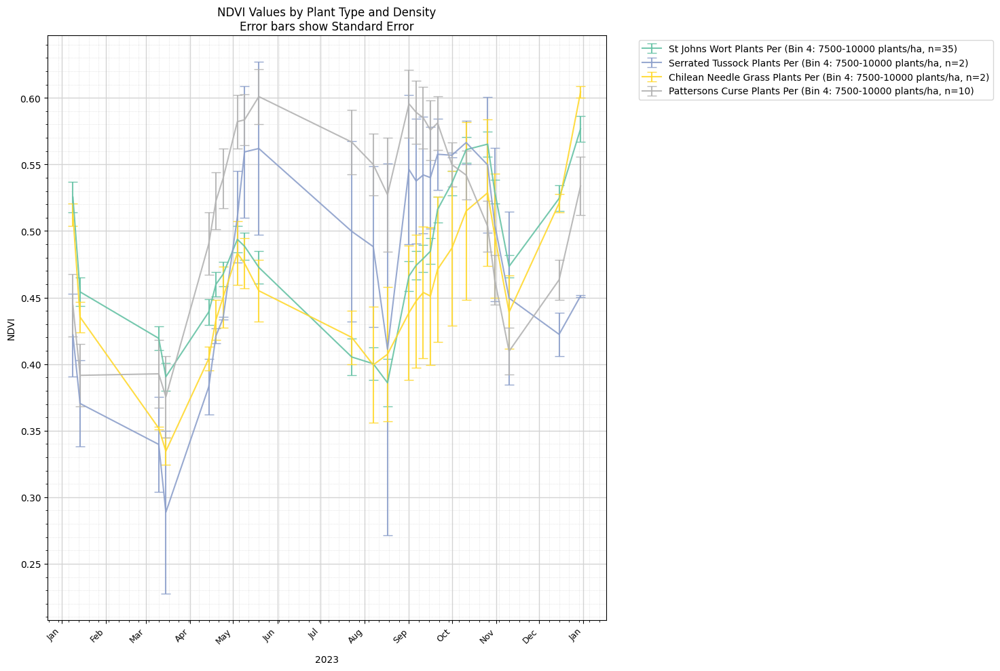

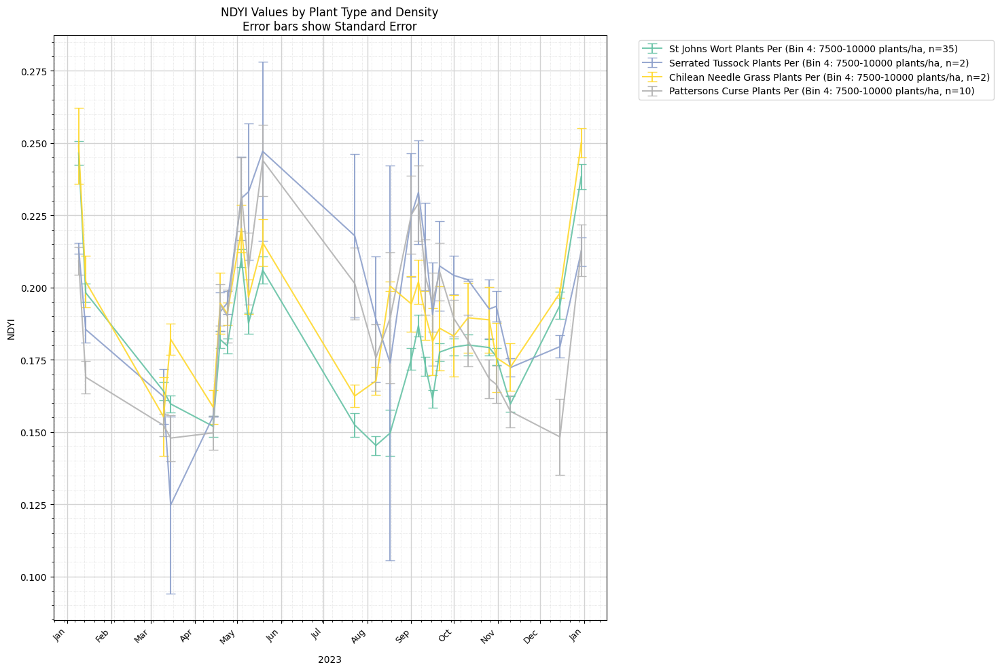

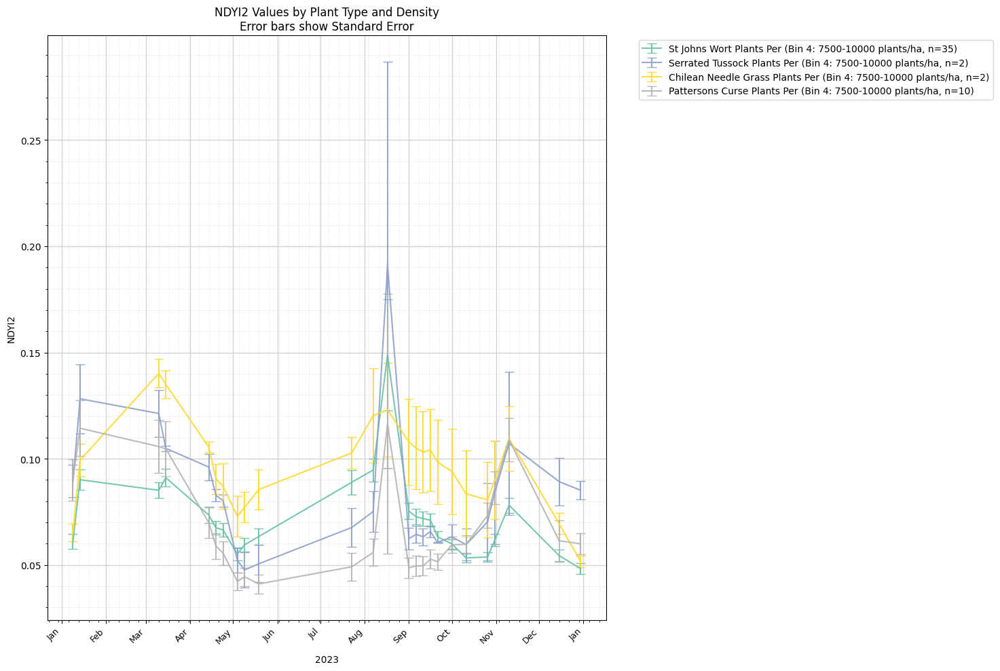

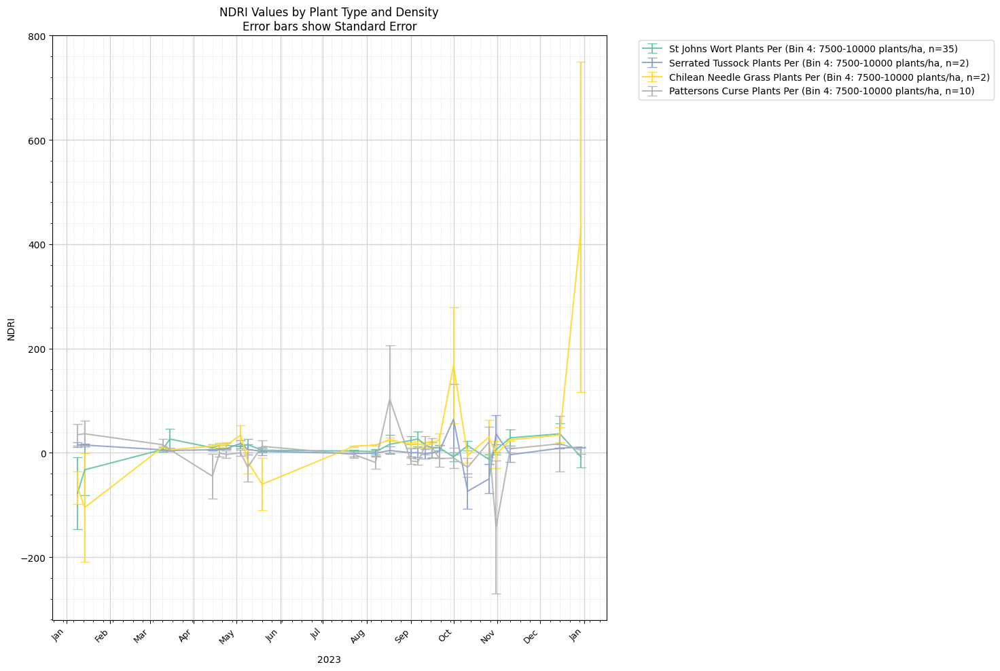

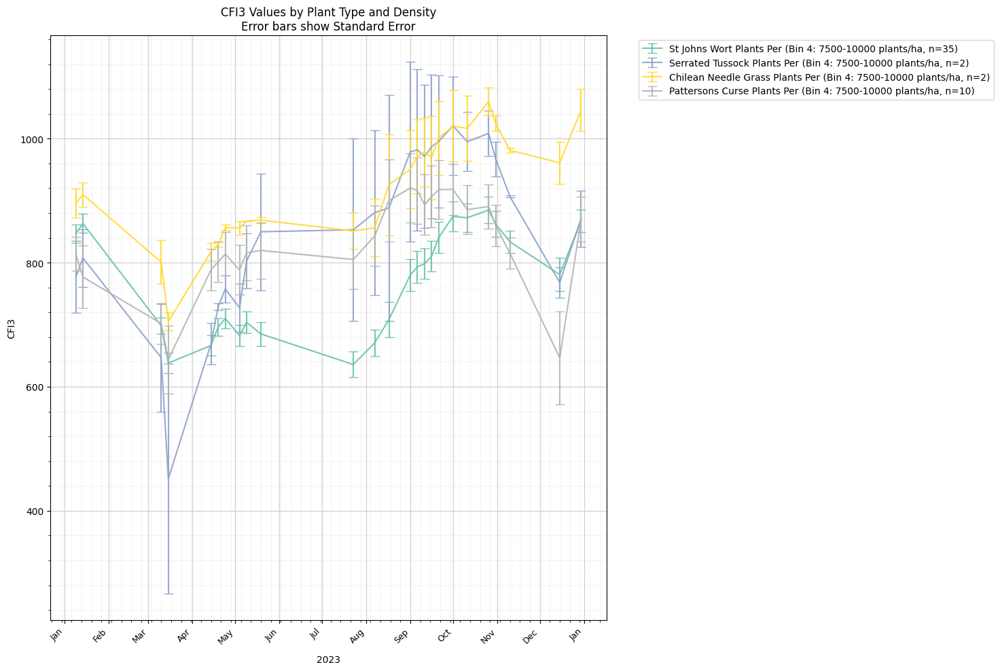

...

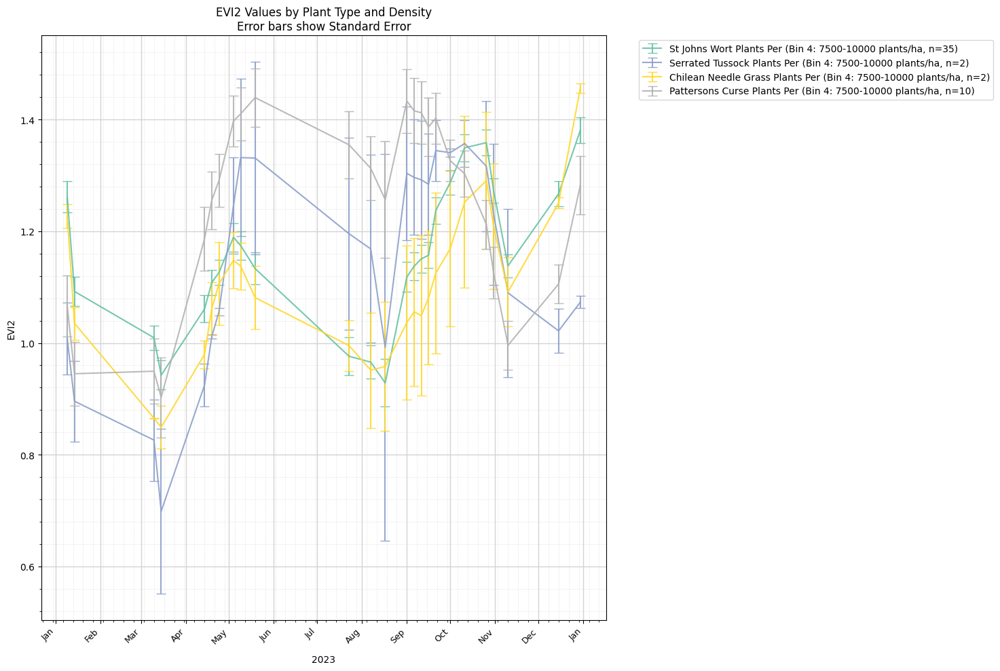

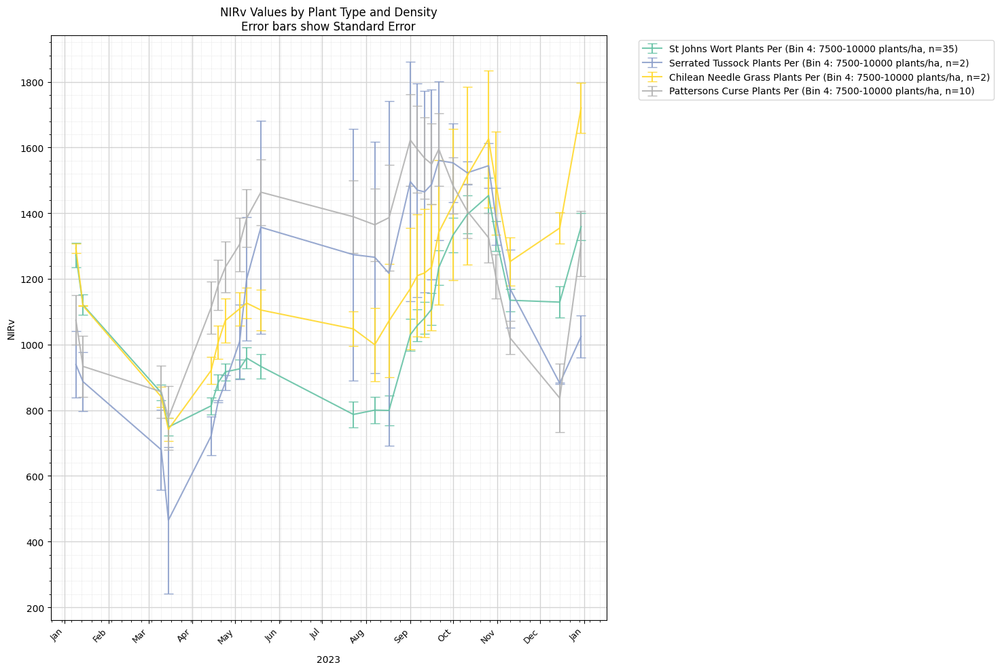

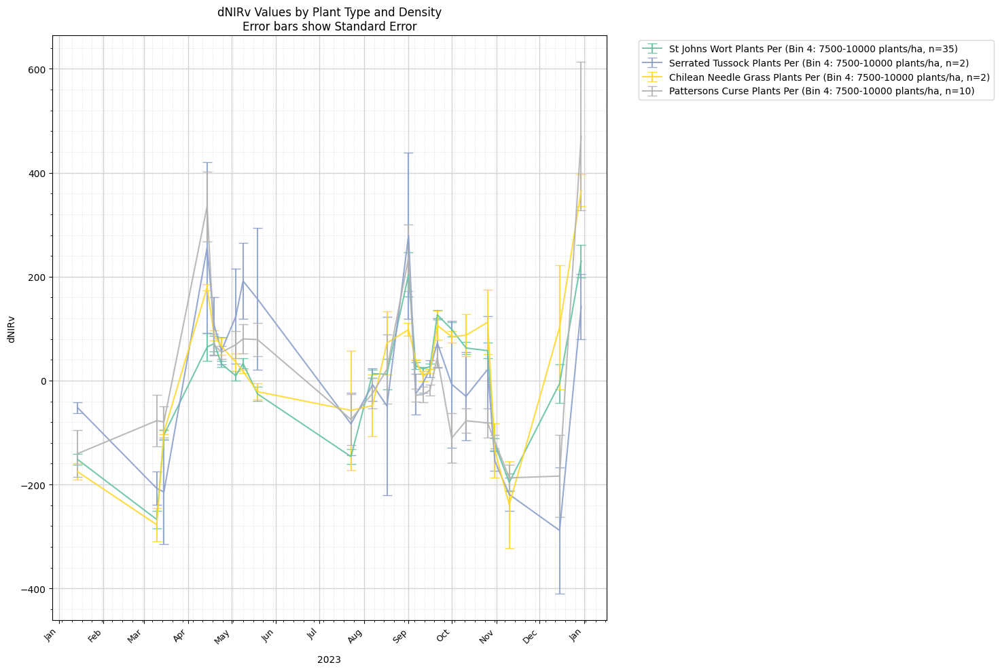

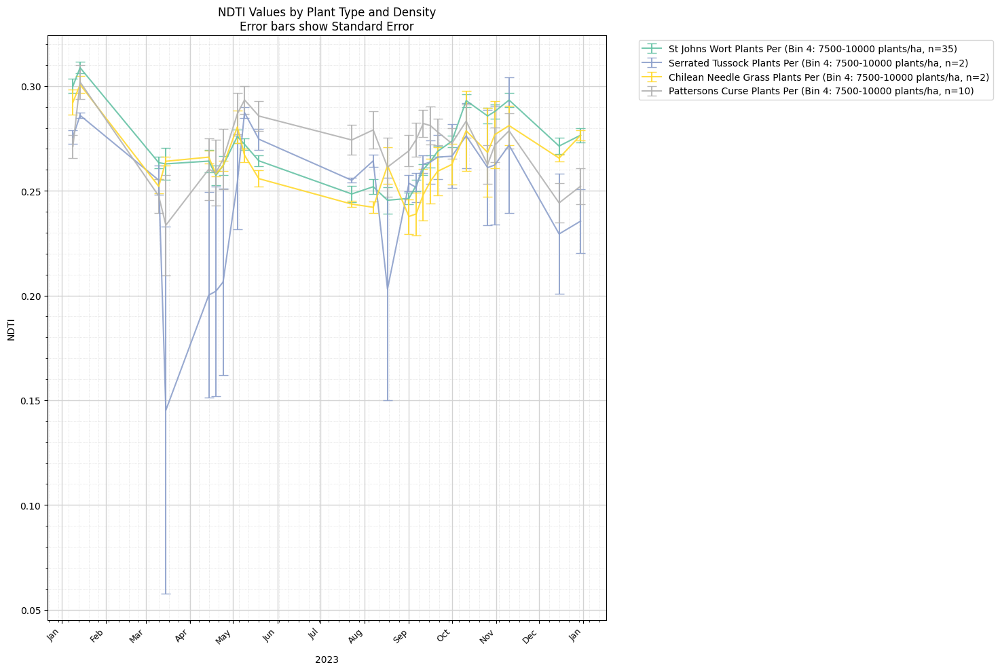

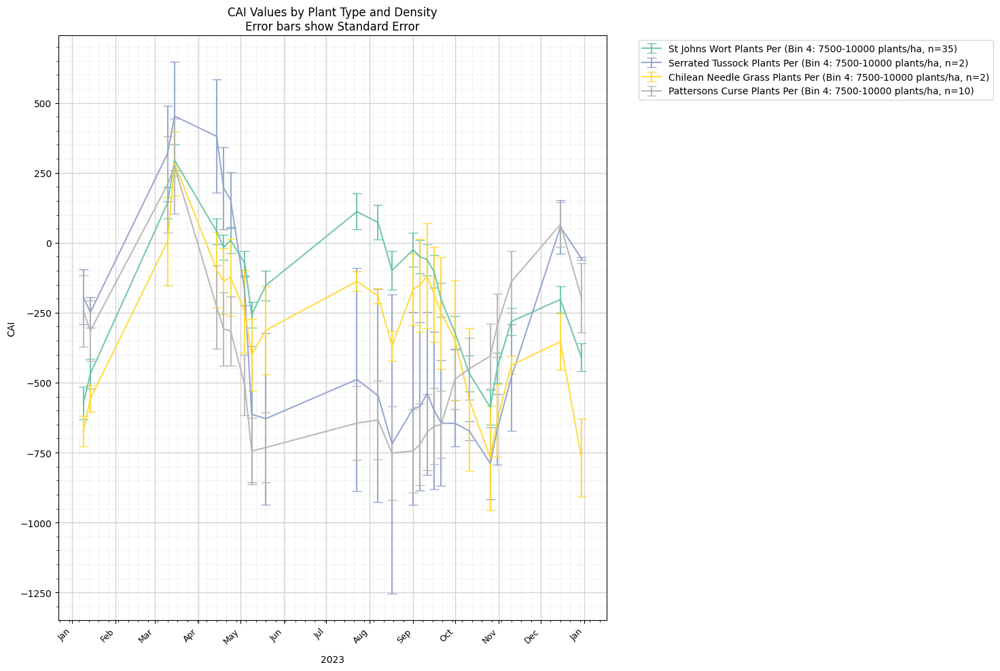

In [41]:
variables = [
    'st_johns_wort_plants_per_ha_binned', 
    'serrated_tussock_plants_per_ha_binned',
   # 'african_love_grass_plants_per_ha_binned',
    'chilean_needle_grass_plants_per_ha_binned',
    #'blackberry_plants_per_ha_binned',
    #'saffron_thistle_plants_per_ha_binned',
    'pattersons_curse_plants_per_ha_binned']
    #    'verbascum_plants_per_ha_binned']

#variables = ['nativeforbdiversity_binned']

index_names = ['NDVI', 'NDYI', 'NDYI2', 'NDRI', 'CFI3', 'CFITB', 'HRFI', 'EVI1', 'EVI2', 'NIRv', 'dNIRv', 'NDTI', 'CAI']#, 'BSI', 'NDSI', 'Iron_Oxide_Index', 'NBR', 'BI']
index_names = ['NDVI', 'NDYI', 'NDYI2', 'NDRI', 'CFI3', 'CFITB', 'HRFI', 'EVI1', 'EVI2', 'NIRv', 'dNIRv', 'NDTI', 'CAI']#, 'BSI', 'NDSI', 'Iron_Oxide_Index', 'NBR', 'BI']
#index_names = ['NDVI'] #, 'CFI3', 'NDYI', 'NDYI2', 'CAI']

#display_vars = ['Low Diversity', 'Moderate Diversity', 'Mod-High Diversity','High Diversity' ]

# Category to Bin Mapping:
# Bin 1 = High Diversity
# Bin 2 = Low Diversity
# Bin 3 = Mod-High Diversity
# Bin 4 = Moderate Diversity

#index_names = ['HRFI']

for index in index_names:
    # Create unique filename for each plot
    output_filepath = outdir + f'SJW/{stub}' + f'/density_{stub}_{index}_' #_{"_".join(v.replace("_binned", "") for v in variables)}'
    results_df, fig = compare_variables_index2(
        ds_filtered,
        variables,
        index,
#        bins_to_plot=[2,4,3,1],  #  plot all bins for forb data
        bins_to_plot=[4],  # just do high density bin 
        error_type='SE',
        #output_filepath=output_filepath,
        print_stats_summary=True,
        include_pvalue_plots=False
        #display_vars=display_vars
    )

In [29]:
def plot_plant_timeseries(ds, variables, bins_to_plot, index_names, var_names=None):
    """
    Plot time series of indices for individual samples by plant type within specified bins
    
    Parameters:
    -----------
    ds : xarray Dataset
        Dataset containing plant and index data
    variables : list
        List of plant variable names to compare
    bins_to_plot : list
        List of bin numbers to include
    index_names : list
        List of index names to plot
    var_names : list, optional
        Display names for variables (if None, uses variable names)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    if var_names is None:
        var_names = [v.replace('_plants_per_ha_binned', '') for v in variables]
    
    # Create subplot for each index
    fig, axs = plt.subplots(len(index_names), 1, 
                           figsize=(15, 8*len(index_names)),
                           squeeze=False)
    axs = axs.flatten()
    
    # More distinct colors - using red and blue as defaults for two variables
    if len(variables) == 2:
        colors = ['#E41A1C', '#377EB8']  # Red and Blue
    else:
        colors = plt.cm.Set2(np.linspace(0, 1, len(variables)))  # Using Set2 colormap for more than 2
    
    # Plot each index
    for idx, index_name in enumerate(index_names):
        ax = axs[idx]
        
        # Plot each plant type
        for var, var_name, color in zip(variables, var_names, colors):
            # For each bin we want to plot
            for bin_num in bins_to_plot:
                # Create mask for this bin
                bin_mask = ds[var] == bin_num
                
                # Get data for this bin
                bin_data = ds.where(bin_mask, drop=True)
                
                # Get number of samples
                n_samples = len(bin_data.paddock)
                
                # Plot each individual time series
                for paddock in bin_data.paddock:
                    paddock_data = bin_data.sel(paddock=paddock)
                    ax.plot(paddock_data.time, 
                           paddock_data.pvt.sel(variable=index_name),
                           color=color, alpha=0.5, linewidth=1)
                
                # Add mean line
                mean_values = bin_data.pvt.sel(variable=index_name).mean(dim='paddock')
                ax.plot(bin_data.time, mean_values, 
                       color=color, linewidth=2, 
                       label=f'{var_name} (bin {bin_num}, n={n_samples})')
        
        ax.set_xlabel('Time')
        ax.set_ylabel(index_name)
        ax.legend()
        ax.set_title(f'{index_name} Time Series by Plant Type (Bins: {bins_to_plot})')
    
    plt.tight_layout()
    plt.show()

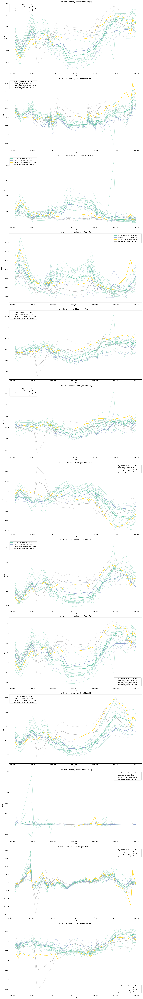

In [31]:

variables = [
    'st_johns_wort_plants_per_ha_binned', 
#    'serrated_tussock_plants_per_ha_binned',
 #  'african_love_grass_plants_per_ha_binned',
#    'chilean_needle_grass_plants_per_ha_binned',
    #'blackberry_plants_per_ha_binned',
    #'saffron_thistle_plants_per_ha_binned',
    'pattersons_curse_plants_per_ha_binned']
    #'verbascum_plants_per_ha_binned']

variables = ['st_johns_wort_plants_per_ha_binned']

variables = [
    'st_johns_wort_plants_per_ha_binned', 
    'serrated_tussock_plants_per_ha_binned',
   # 'african_love_grass_plants_per_ha_binned',
    'chilean_needle_grass_plants_per_ha_binned',
    #'blackberry_plants_per_ha_binned',
    #'saffron_thistle_plants_per_ha_binned',
    'pattersons_curse_plants_per_ha_binned']

index_names = ['NDVI', 'NDYI', 'NDYI2', 'HRFI', 'CFI3', 'CFITB', 'CAI', 'EVI1', 'EVI2', 'NIRv', 'NDRI', 'dNIRv', 'NDTI']#, 'BSI', 'NDSI', 'Iron_Oxide_Index', 'NBR', 'BI']

#var_names = ["St John's Wort", "Patterson's Curse"]
bins_to_plot = [4]
#index_names = ['NDVI']

plot_plant_timeseries(ds_filtered, 
                            variables, 
                            bins_to_plot, 
                            index_names)

In [36]:
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
from dtaidistance import dtw
from dtaidistance import clustering
def analyze_dtw_patterns(ds, variables, bins_to_plot, index_names, var_names=None):
    """
    Analyze temporal patterns using Dynamic Time Warping (DTW)
    
    Parameters:
    -----------
    ds : xarray Dataset
        Dataset containing plant and index data
    variables : list
        List of plant variable names to compare
    bins_to_plot : list
        List of bin numbers to include
    index_names : list
        List of index names to analyze
    var_names : list, optional
        Display names for variables (if None, uses variable names)
    """
    if var_names is None:
        var_names = [v.replace('_plants_per_ha_binned', '') for v in variables]
    
    # Store time series and metadata
    all_series = []
    metadata = []
    
    # Extract time series for each plant type and bin
    for var, var_name in zip(variables, var_names):
        for bin_num in bins_to_plot:
            # Create mask for this bin
            bin_mask = ds[var] == bin_num
            bin_data = ds.where(bin_mask, drop=True)
            
            # For each paddock in this bin
            for paddock in bin_data.paddock:
                paddock_data = bin_data.sel(paddock=paddock)
                
                # Store time series for each index
                for index_name in index_names:
                    series = paddock_data.pvt.sel(variable=index_name).values
                    
                    # Normalize series to make DTW comparison more meaningful
                    series = (series - np.mean(series)) / np.std(series)
                    
                    all_series.append(series)
                    metadata.append({
                        'plant_type': var_name,
                        'bin': bin_num,
                        'paddock': paddock.values,
                        'index': index_name
                    })
    
    # Convert to numpy array for DTW
    series_array = np.array(all_series)
    
    # Calculate DTW distance matrix
    n_series = len(all_series)
    distance_matrix = np.zeros((n_series, n_series))
    
    for i in range(n_series):
        for j in range(i+1, n_series):
            distance = dtw.distance(series_array[i], series_array[j])
            distance_matrix[i, j] = distance
            distance_matrix[j, i] = distance
    
    # Create figure for each index
    for index_name in index_names:
        # Filter series for this index
        index_mask = [m['index'] == index_name for m in metadata]
        index_distances = distance_matrix[index_mask][:, index_mask]
        index_metadata = [m for m, mask in zip(metadata, index_mask) if mask]
        
        # Create figure with subplots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
        
        # Plot hierarchical clustering
        linkage_matrix = hierarchy.linkage(squareform(index_distances), 
                                         method='average')
        
        # Color map for plant types
        unique_plants = list(set(m['plant_type'] for m in index_metadata))
        color_dict = dict(zip(unique_plants, 
                            sns.color_palette('Set2', len(unique_plants))))
        
        # Create color list for dendrogram
        leaf_colors = [color_dict[m['plant_type']] 
                      for m in index_metadata]
        
        # Plot dendrogram
        hierarchy.dendrogram(linkage_matrix, 
                           ax=ax1,
                           leaf_rotation=90,
                           leaf_color=leaf_colors)
        ax1.set_title(f'Hierarchical Clustering of {index_name} Time Series')
        
        # Plot distance matrix heatmap
        im = ax2.imshow(index_distances, cmap='viridis')
        plt.colorbar(im, ax=ax2, label='DTW Distance')
        ax2.set_title(f'DTW Distance Matrix for {index_name}')
        
        # Add legend
        legend_elements = [plt.Line2D([0], [0], color=color, lw=4, 
                                    label=plant_type)
                         for plant_type, color in color_dict.items()]
        ax1.legend(handles=legend_elements, 
                  title='Plant Types',
                  bbox_to_anchor=(1.05, 1))
        
        plt.tight_layout()
        plt.show()
        
        # Print summary statistics
        print(f"\nDTW Analysis Summary for {index_name}:")
        print("-" * 50)
        
        # Calculate mean within-group and between-group distances
        for plant1 in unique_plants:
            indices1 = [i for i, m in enumerate(index_metadata) 
                       if m['plant_type'] == plant1]
            
            # Within-group distances
            within_distances = index_distances[indices1][:, indices1]
            within_mean = np.mean(within_distances[np.triu_indices_from(within_distances, k=1)])
            
            print(f"\n{plant1} within-group mean distance: {within_mean:.3f}")
            
            # Between-group distances
            for plant2 in unique_plants:
                if plant1 < plant2:
                    indices2 = [i for i, m in enumerate(index_metadata) 
                              if m['plant_type'] == plant2]
                    between_distances = index_distances[indices1][:, indices2]
                    between_mean = np.mean(between_distances)
                    print(f"{plant1} vs {plant2} mean distance: {between_mean:.3f}")

# The function can be called like this:
# analyze_dtw_patterns(ds_filtered, variables, bins_to_plot, index_names, var_names)

ModuleNotFoundError: No module named 'dtaidistance'

In [62]:
def analyze_seasonal_patterns(ds, variables, bins_to_plot, index_name, output_filepath=None, var_names=None):
    """
    Analyze temporal patterns using seasonal decomposition, handling missing data
    
    Parameters:
    -----------
    ds : xarray Dataset
        Dataset containing plant and index data
    variables : list
        List of plant variable names to compare
    bins_to_plot : list
        List of bin numbers to include
    index_name : str
        Name of index to analyze
    var_names : list, optional
        Display names for variables (if None, uses variable names)
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy import signal
    from scipy import stats
    
    if var_names is None:
        var_names = [v.replace('_plants_per_ha_binned', '') for v in variables]
    
    # First pass to collect all values for determining global min/max
    all_values = []
    
    # Collect all values across all plant types
    for var, var_name in zip(variables, var_names):
        bin_mask = ds[var].isin(bins_to_plot)
        bin_data = ds.where(bin_mask, drop=True)
        
        for paddock in bin_data.paddock:
            series = bin_data.sel(paddock=paddock).pvt.sel(variable=index_name)
            
            # Skip if too many NaN values
            if series.isnull().sum() > len(series) * 0.5:
                continue
            
            # Simple linear interpolation for NaN values
            series_clean = series.interpolate_na(dim='time')
            series_values = series_clean.values
            
            try:
                # Calculate components
                trend = signal.detrend(series_values)
                detrended = series_values - trend
                
                n_samples = len(series_values)
                fft_result = np.fft.fft(detrended)
                freqs = np.fft.fftfreq(n_samples)
                
                dominant_mask = np.abs(fft_result) > np.percentile(np.abs(fft_result), 90)
                fft_filtered = fft_result * dominant_mask
                seasonal = np.real(np.fft.ifft(fft_filtered))
                
                residual = detrended - seasonal
                
                # Collect all components for min/max calculation
                all_values.extend([trend, seasonal, residual])
                
            except Exception as e:
                continue
    
    # Calculate global min/max from all components
    all_values = np.concatenate(all_values)
    global_min = np.nanmin(all_values)
    global_max = np.nanmax(all_values)
    
    # Add some padding to the limits
    y_range = global_max - global_min
    y_min = global_min - 0.1 * y_range
    y_max = global_max + 0.1 * y_range
    
    # Create figure
    fig, axs = plt.subplots(len(variables), 3, figsize=(20, 6*len(variables)))
    if len(variables) == 1:
        axs = axs.reshape(1, -1)
    
    # Plot for each plant type
    for i, (var, var_name) in enumerate(zip(variables, var_names)):
        # Get data for this bin
        bin_mask = ds[var].isin(bins_to_plot)
        bin_data = ds.where(bin_mask, drop=True)
        
        # Store decomposed components
        trends = []
        seasonals = []
        residuals = []
        
        # Process each paddock
        for paddock in bin_data.paddock:
            # Get time series for this paddock
            series = bin_data.sel(paddock=paddock).pvt.sel(variable=index_name)
            
            # Skip if too many NaN values
            if series.isnull().sum() > len(series) * 0.5:
                continue
            
            # Simple linear interpolation for NaN values
            series_clean = series.interpolate_na(dim='time')
            series_values = series_clean.values
            
            try:
                # Decompose the series
                trend = signal.detrend(series_values)
                detrended = series_values - trend
                
                # Use FFT to extract seasonal component
                n_samples = len(series_values)
                fft_result = np.fft.fft(detrended)
                freqs = np.fft.fftfreq(n_samples)
                
                # Keep only the dominant frequencies
                dominant_mask = np.abs(fft_result) > np.percentile(np.abs(fft_result), 90)
                fft_filtered = fft_result * dominant_mask
                seasonal = np.real(np.fft.ifft(fft_filtered))
                
                # Calculate residual
                residual = detrended - seasonal
                
                # Store components
                trends.append(trend)
                seasonals.append(seasonal)
                residuals.append(residual)
                
            except Exception as e:
                print(f"Error processing paddock {paddock.values}: {str(e)}")
                continue
        
        if not trends:
            print(f"No valid series for {var_name}")
            continue
            
        # Convert to arrays
        trends = np.array(trends)
        seasonals = np.array(seasonals)
        residuals = np.array(residuals)
        
        # Plot components
        time_points = np.arange(n_samples)
        
        # Plot trend
        axs[i, 0].plot(time_points, trends.T, alpha=0.2, color='gray')
        axs[i, 0].plot(time_points, np.nanmean(trends, axis=0), color='red', linewidth=2)
        axs[i, 0].set_title(f'{var_name} - Trend (n={len(trends)})')
        axs[i, 0].set_ylabel(index_name)
        axs[i, 0].set_ylim(y_min, y_max)
        
        # Plot seasonal
        axs[i, 1].plot(time_points, seasonals.T, alpha=0.2, color='gray')
        axs[i, 1].plot(time_points, np.nanmean(seasonals, axis=0), color='blue', linewidth=2)
        axs[i, 1].set_title(f'{var_name} - Seasonal')
        axs[i, 1].set_ylim(y_min, y_max)
        
        # Plot residual
        axs[i, 2].plot(time_points, residuals.T, alpha=0.2, color='gray')
        axs[i, 2].plot(time_points, np.nanmean(residuals, axis=0), color='green', linewidth=2)
        axs[i, 2].set_title(f'{var_name} - Residual')
        axs[i, 2].set_ylim(y_min, y_max)
        
        # Add statistics
        print(f"\nStatistics for {var_name} - {index_name}:")
        print("-" * 50)
        print(f"Number of valid series: {len(trends)}")
        print(f"Trend variance: {np.nanvar(trends):.3f}")
        print(f"Seasonal variance: {np.nanvar(seasonals):.3f}")
        print(f"Residual variance: {np.nanvar(residuals):.3f}")
        
        # Calculate characteristic frequencies
        fft_seasonal = np.fft.fft(np.nanmean(seasonals, axis=0))
        freqs = np.fft.fftfreq(len(seasonals[0]))
        dominant_freq = freqs[np.argmax(np.abs(fft_seasonal))]
        print(f"Dominant frequency: {abs(dominant_freq):.3f}")
    
    plt.suptitle(f'Temporal Patterns for {index_name} |', y=1.02, fontsize=14)
    plt.tight_layout()
    
    # Compare components between plant types
    if len(variables) > 1:
        print("\nComponent Comparisons:")
        print("-" * 50)
        for comp_name, components in [("Trend", trends), 
                                   ("Seasonal", seasonals), 
                                   ("Residual", residuals)]:
            # Remove any NaN values for the statistical test
            valid_components = [comp[~np.isnan(comp)] for comp in components]
            if all(len(comp) > 0 for comp in valid_components):
                try:
                    f_stat, p_value = stats.f_oneway(*valid_components)
                    print(f"\n{comp_name} component ANOVA:")
                    print(f"F-statistic: {f_stat:.3f}")
                    print(f"p-value: {p_value:.4f}")
                except Exception as e:
                    print(f"Could not perform ANOVA for {comp_name}: {str(e)}")
    if output_filepath:
        output_filepath = f"{output_filepath}.png"
        fig.savefig(output_filepath, dpi=300, bbox_inches='tight', format='png')
        print("Figure saved to:", output_filepath)
    
    return fig

# Example usage:
# for index_name in index_names:
#     fig = analyze_seasonal_patterns(ds_filtered, variables, bins_to_plot, index_name, var_names)
#     plt.show()


Statistics for st_johns_wort_plants_per_ha_binned - CFI3:
--------------------------------------------------
Number of valid series: 18
Trend variance: 7965.551
Seasonal variance: 4467.684
Residual variance: 1069.076
Dominant frequency: 0.000

Statistics for serrated_tussock_plants_per_ha_binned - CFI3:
--------------------------------------------------
Number of valid series: 2
Trend variance: 9160.833
Seasonal variance: 1854.553
Residual variance: 275.413
Dominant frequency: 0.000

Statistics for pattersons_curse_plants_per_ha_binned - CFI3:
--------------------------------------------------
Number of valid series: 2
Trend variance: 7081.719
Seasonal variance: 11703.331
Residual variance: 2341.092
Dominant frequency: 0.000

Component Comparisons:
--------------------------------------------------

Trend component ANOVA:
F-statistic: 0.000
p-value: 1.0000

Seasonal component ANOVA:
F-statistic: 135.761
p-value: 0.0000

Residual component ANOVA:
F-statistic: 0.000
p-value: 1.0000
Figu

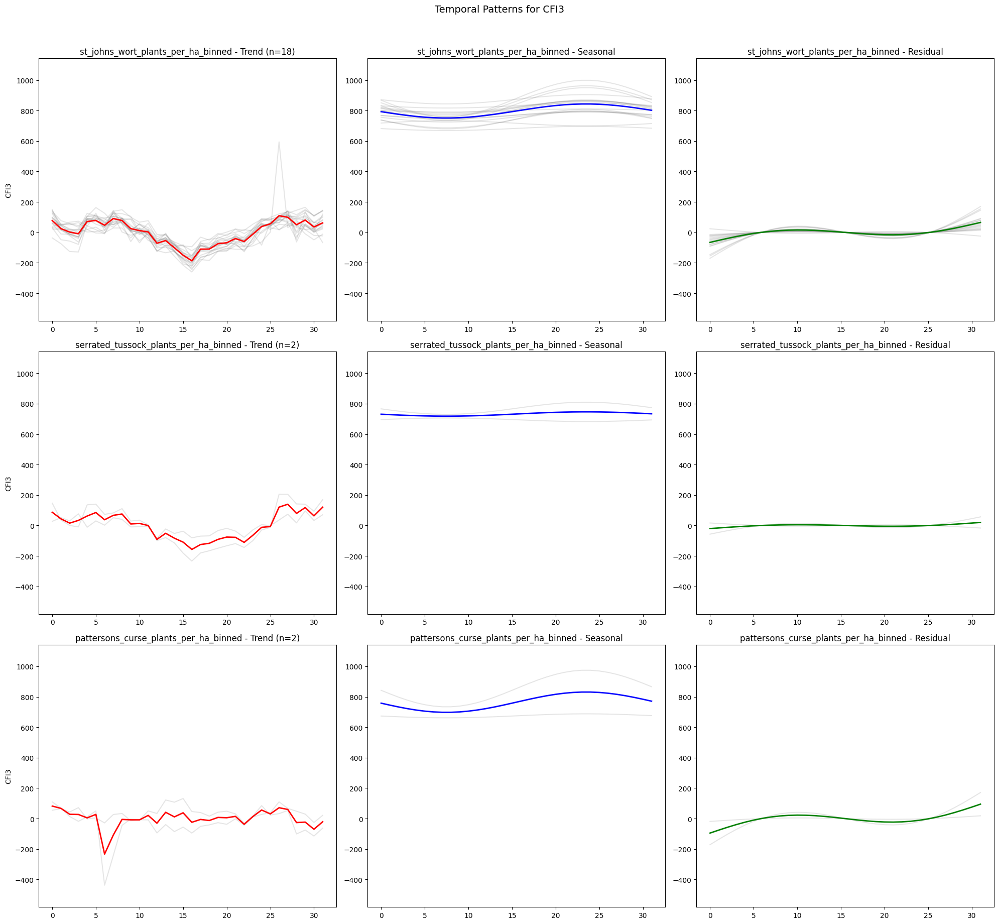

In [63]:
variables = [
    'st_johns_wort_plants_per_ha_binned', 
    'serrated_tussock_plants_per_ha_binned',
   # 'african_love_grass_plants_per_ha_binned',
 #   'chilean_needle_grass_plants_per_ha_binned',
    #'blackberry_plants_per_ha_binned',
    #'saffron_thistle_plants_per_ha_binned',
    'pattersons_curse_plants_per_ha_binned']

index_names = ['NDVI', 'NDYI', 'NDYI2', 'HRFI', 'CFI3', 'CFITB', 'CAI', 'EVI1', 'EVI2', 'NIRv', 'NDRI', 'dNIRv', 'NDTI']#, 'BSI', 'NDSI', 'Iron_Oxide_Index', 'NBR', 'BI']
index_names = ['CFI3']
#var_names = ["St John's Wort", "Patterson's Curse"]
bins_to_plot = [4]

var_names = variables 

for index in index_names:
    # Create unique filename for each plot
    output_filepath = outdir + f'SJW/{stub}' + f'/seasonal-patterns_{stub}_{index}_' #_{"_".join(v.replace("_binned", "") for v in variables)}'
    fig = analyze_seasonal_patterns(
        ds_filtered,
        variables,
        bins_to_plot,
        index,
        output_filepath = output_filepath,
        var_names=var_names)
    plt.show()

### Cumulative sum of indices, per plant

In [50]:
def plot_summed_timeseries_per_plant(ds, variables, bins_to_plot, index_names, var_names=None):
    """
    Plot cumulative sum of indices through time for individual samples by plant type within specified bins
    
    Parameters:
    -----------
    ds : xarray Dataset
        Dataset containing plant and index data
    variables : list
        List of plant variable names to compare
    bins_to_plot : list
        List of bin numbers to include
    index_names : list
        List of index names to plot
    var_names : list, optional
        Display names for variables (if None, uses variable names)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    if var_names is None:
        var_names = [v.replace('_plants_per_ha_binned', '') for v in variables]
    
    # Create subplot for each index
    fig, axs = plt.subplots(len(index_names), 1, 
                           figsize=(15, 8*len(index_names)),
                           squeeze=False)
    axs = axs.flatten()
    
    # More distinct colors for two variables
    if len(variables) == 2:
        colors = ['#E41A1C', '#377EB8']  # Red and Blue
    else:
        colors = plt.cm.Set2(np.linspace(0, 1, len(variables)))
    
    # Plot each index
    for idx, index_name in enumerate(index_names):
        ax = axs[idx]
        
        # Plot each plant type
        for var, var_name, color in zip(variables, var_names, colors):
            # For each bin we want to plot
            for bin_num in bins_to_plot:
                # Create mask for this bin
                bin_mask = ds[var] == bin_num
                
                # Get data for this bin
                bin_data = ds.where(bin_mask, drop=True)
                
                # Get number of samples
                n_samples = len(bin_data.paddock)
                
                # Plot each individual time series (cumulative sum)
                for paddock in bin_data.paddock:
                    paddock_data = bin_data.sel(paddock=paddock)
                    cumsum_values = paddock_data.pvt.sel(variable=index_name).cumsum(dim='time')
                    ax.plot(paddock_data.time, 
                           cumsum_values,
                           color=color, alpha=0.5, linewidth=1)
                
                # Add mean cumulative sum line
                mean_values = bin_data.pvt.sel(variable=index_name).mean(dim='paddock').cumsum(dim='time')
                ax.plot(bin_data.time, mean_values, 
                       color=color, linewidth=2, 
                       label=f'{var_name} (bin {bin_num}, n={n_samples})')
        
        ax.set_xlabel('Time')
        ax.set_ylabel(f'Cumulative {index_name}')
        ax.legend()
        ax.set_title(f'Cumulative {index_name} Through Time by Plant Type (Bins: {bins_to_plot})')
    
    plt.tight_layout()
    plt.show()

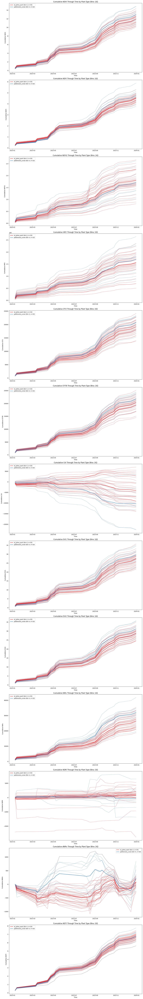

In [52]:
variables = [
    'st_johns_wort_plants_per_ha_binned', 
#    'serrated_tussock_plants_per_ha_binned',
 #  'african_love_grass_plants_per_ha_binned',
#    'chilean_needle_grass_plants_per_ha_binned',
    #'blackberry_plants_per_ha_binned',
    #'saffron_thistle_plants_per_ha_binned',
    'pattersons_curse_plants_per_ha_binned']
    #'verbascum_plants_per_ha_binned']

#variables = ['st_johns_wort_plants_per_ha_binned']

index_names = ['NDVI', 'NDYI', 'NDYI2', 'HRFI', 'CFI3', 'CFITB', 'CAI', 'EVI1', 'EVI2', 'NIRv', 'NDRI', 'dNIRv', 'NDTI']#, 'BSI', 'NDSI', 'Iron_Oxide_Index', 'NBR', 'BI']

#var_names = ["St John's Wort", "Patterson's Curse"]
bins_to_plot = [4]
#index_names = ['NDVI']

plot_summed_timeseries_per_plant(ds_filtered, 
                            variables, 
                            bins_to_plot, 
                            index_names)

## This section of code is for working with the Ground Sampling data
This code requires the ground sampling data has been pre classified into groups ("type")

Plot veg classes and Indices

In [ ]:
# List unique classification values:
type_series = pd.Series(ds_weekly_paddocks['type'].values.flatten())
type_series = pd.Series(ds_weekly_paddocks['class_scaled'].values.flatten())

# Get the count of each unique type
type_counts = type_series.value_counts()

print(type_counts)


#### Def Clustermap2

#### Function definitions


In [73]:
def plot_clustermap2(ds_paddocks, variable_name, outdir, stub):
    '''This version only shows the named paddocks, and therefore does not color rows by 'type'.
    Also, attach crop type to the row label. 
    Put colour bar above plot to make more room for row labels...
    '''
    # Check if the variable_name exists in the dataset
    if variable_name not in ds_paddocks.variable.values:
        raise ValueError(f"Variable '{variable_name}' not found in the dataset.")
    
    # Extract the time series for the specified variable for all paddocks
    pt_variable = ds_paddocks.sel(variable=variable_name).pvt.values
    
    # Interpolate missing values along the time axis (2nd axis)
    pt_variable = np.apply_along_axis(
        lambda x: pd.Series(x).interpolate(method='linear', limit_direction='both').to_numpy(), 
        axis=1, 
        arr=pt_variable
    )

    print(pt_variable.shape)
    # Count NaN values
    nan_count = np.sum(np.isnan(pt_variable))
    print(f"Number of NaN values: {nan_count}")
    print("replacing nans with 0, for now, so the clustering can work..")
    pt_variable = np.nan_to_num(pt_variable, nan=0)

    # Extract the timestamps and convert to Pandas DatetimeIndex
    time_stamps = ds_paddocks.time.values
    time_index = pd.to_datetime(time_stamps)

    # Adjust start date to include January if necessary
    start_date = time_index.min()
    if start_date.month != 1:
        start_date = pd.Timestamp(year=start_date.year, month=1, day=1)
    
    # Ensure January is included in monthly_start
    monthly_start = pd.date_range(start=start_date, end=time_index.max(), freq='MS')

    # Find the closest previous timestamps in the original time_index
    monthly_ticks = []
    for date in monthly_start:
        prior_dates = time_index[time_index <= date]
        if not prior_dates.empty:
            monthly_ticks.append(prior_dates[-1])

    monthly_ticks_str = [str(t)[:10] for t in monthly_ticks]

    # Extract the crop type information for the specified year
    crop_col = f'{year}_Crop'
    the_crops = pad_manan[pad_manan['type'] == 'named'][crop_col].fillna('') #crops planted this year for named paddocks only. 
    the_crops = the_crops.apply(lambda x: x.strip() if isinstance(x, str) else x).replace('', '')
    the_crops

    # get paddock names
    row_names = ds_paddocks.name.values
    
    # Merge paddock names and crop types for row labels
    if len(row_names) != len(the_crops):
        raise ValueError("The two lists must be of the same length.")
        
    names_crops = [f"{r} / {c}" for r, c in zip(row_names, the_crops)]
    
    # Plot heatmap with clustering of the rows
    plt.figure(figsize=(6, 12))  # Adjust the figure size as needed

    # from matplotlib.colors import LinearSegmentedColormap
    # # Define custom colormap
    # colors = ['#8B4513', '#FFFFFF', '#008000']  # Brown, White, Green
    # n_bins = 100  # Discretizes the interpolation into bins
    # cmap_name = 'custom_diverging'
    # custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

    # g = sns.clustermap(pt_variable, method='average', metric='euclidean', 
    #                row_cluster=True, col_cluster=False, cmap=custom_cmap)
    
    g = sns.clustermap(pt_variable, method='average', metric='euclidean', 
                       row_cluster=True, col_cluster=False, cmap='viridis')

    # Get the order of the rows after clustering
    row_order = g.dendrogram_row.reordered_ind

    # Reorder the row names according to the clustering
    ordered_row_names = [names_crops[i] for i in row_order]

    # Customize the plot
    g.ax_heatmap.set_xlabel('Time')
    #g.ax_heatmap.set_ylabel('Paddock')

    # Set the x-tick labels to the closest previous valid timestamp of each month
    tick_positions = [time_index.get_loc(t) for t in monthly_ticks]
    g.ax_heatmap.set_xticks(tick_positions)
    g.ax_heatmap.set_xticklabels(monthly_ticks_str, rotation=45, ha='right')

    # Set the y-tick labels to the ordered paddock IDs
    g.ax_heatmap.set_yticklabels(ordered_row_names, fontsize=7, rotation=0)
    g.ax_heatmap.set_yticks(np.arange(len(ordered_row_names)) + 0.5)

    # # Customize the color bar and position it above the heatmap horizontally
    # g.cax.set_position([0.25, 1.02, 0.5, 0.02])  # [left, bottom, width, height]
    # g.cax.xaxis.set_ticks_position('top')
    # g.cax.xaxis.set_label_position('top')
    g.cax.set_title(variable_name, pad=10)  # Title above the color bar


    # Save the plot to results
    plt.savefig(outdir + stub + f"_pt-{variable_name}.png", bbox_inches='tight')

    # Print the number of missing pixels across all time series for the variable
    print(f'Number of missing pixels across all {variable_name} time series:', np.count_nonzero(np.isnan(pt_variable)))

In [43]:
import matplotlib.dates as mdates
import scipy.stats as stats
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MultipleLocator

def plot_mean_sd_by_type(ds, spectral_index, group_by_variable, indices_max_min_values=None, year=None, outdir=None, stub=None, confidence_level=0.95, extra_text=None, error_type='ci'):
    """
    Plots the mean and error (SD, SE, or CI) of the spectral index grouped by the specified variable.

    Parameters:
    ds (xarray.Dataset): The dataset containing spectral data.
    spectral_index (str): The spectral index variable to analyze.
    group_by_variable (str): The variable by which to group the data (e.g., 'classification').
    indices_max_min_values (Array format: array('index_name', max_int, min_int)): Pass an array of the max/min values for the all the indices so the plots have consistent indices between years. 
    year (int, optional): The year to filter by. Defaults to None (no filtering).
    outdir (str, optional): The directory to save the output plot. Defaults to None (no saving).
    stub (str, optional): The file name stub for saving the plot. Defaults to None.
    confidence_level (decimal, options): Only used with CI. Default is 95% (0.95)
    extra_text (str, optional): Anything to concatenate on the filename before saving.
    error_type (str, optional): Type of error to plot ('SD', 'SE', or 'CI'). Defaults to 'CI'.
    """

    # ds_time = pd.to_datetime(ds.time.values)
    # # First get the original timepoints from spectral_data
    #     original_times = pd.to_datetime(ds.time.values)
    # #original_times = spectral_data.time.values

    # Define custom colours

    if group_by_variable == "type" or group_by_variable == "class_scaled":
        plot_type = "% Native vs %Exotic" #Text to put in figure Title
        colour_map = {
            'native': 'green',
            'mixed-high': '#80b357',  # Light greenish
            'mixed-med': '#bf8c4c',   # Brownish (in between)
            'mixed-low': '#e06666',   # Light reddish
            'exotic': 'red'
        }
    
        # Lighter shades for the standard deviation areas
        sd_colour_map = {
            'native': 'lightgreen',
            'mixed-high': '#b3d7a1',  # Lighter greenish
            'mixed-med': '#d3b38f',   # Lighter brownish
            'mixed-low': '#f4cccc',   # Lighter reddish
            'exotic': 'salmon'
        }
    elif group_by_variable == "type_str":
        ## Use this for Annual/Perrenial (this whole setup should be generalised)
        plot_type = "% Annual vs % Perrenial" #Text to put in figure Title
        colour_map = {
            'Over 33% Perrenial': 'green',
            'Mixed annual and Perrenial': '#bf8c4c',   # Brownish (in between)
            'Over 33% Annual': 'red'
        }
   
        sd_colour_map = {
            'Over 33% Perrenial': 'lightgreen',
            'Mixed annual and Perrenial': '#d3b38f',   # Lighter brownish
            'Over 33% Annual': 'salmon'
        }
    else:
        print("Function only works for '%native vs %exotic' and 'Exotic % Perrenial vs % Annual. \n")
    
    # Data preparation
    spectral_data = ds['pvt'].sel(variable=spectral_index)
    if year is not None:
        spectral_data = spectral_data.sel(time=spectral_data['time'].dt.year == year)
    else:
        year = "All_Years"

    #get the original timepoints from spectral_data (for plotting the specific satellite timepoints)
    original_times = spectral_data.time.values

    spectral_data_with_group = spectral_data.assign_coords({group_by_variable: ds[group_by_variable]})
    grouped = spectral_data_with_group.groupby(group_by_variable)

    # Compute statistics
    mean_values = grouped.mean(dim='paddock')
    std_values = grouped.std(dim='paddock')

    # Get unique values and their counts
    unique_values, counts = np.unique(ds[group_by_variable].values, return_counts=True)
   
    # Create a dictionary mapping each unique value to its count
    sample_size_dict = dict(zip(unique_values, counts))
    
    # Create a DataArray with the same structure as mean_values, filled with the appropriate sample sizes
    sample_size = xr.full_like(mean_values, np.nan)
    for value in unique_values:
        sample_size.loc[{group_by_variable: value}] = sample_size_dict[value]
    
    # Ensure sample_size has the same groups as mean_values and in the same order
    sample_size = sample_size.sel({group_by_variable: mean_values[group_by_variable]})
    
    # Calculate Standard Error
    se_values = std_values / np.sqrt(sample_size)

    # Calculate confidence interval
    #confidence_level = 0.95
    degrees_of_freedom = sample_size - 1
    t_value = stats.t.ppf((1 + confidence_level) / 2, degrees_of_freedom)
    ci_lower = mean_values - (t_value * se_values)
    ci_upper = mean_values + (t_value * se_values)

    # Sort the classification to the desired order
#    desired_order = ['Over 33% Perrenial', 'Mixed annual and Perrenial', 'Over 33% Annual']
    desired_order = list(colour_map.keys())
    mean_values = mean_values.sel({group_by_variable: desired_order})
    std_values = std_values.sel({group_by_variable: desired_order})
    se_values = se_values.sel({group_by_variable: desired_order})
    ci_lower = ci_lower.sel({group_by_variable: desired_order})
    ci_upper = ci_upper.sel({group_by_variable: desired_order})


    # Prepare max/min values for this index:
    max_min_entry = indices_max_min_values[indices_max_min_values['Variable'] == spectral_index]
    
    if max_min_entry.size > 0:
        max_value = max_min_entry['Max'][0]
        min_value = max_min_entry['Min'][0]
    else:
        max_value = None
        min_value = None

    # Plotting
    plt.figure(figsize=(10, 6))
    
    for group in desired_order:
        # Get the sample size for this group
        #print("Now on Group:", group)
        n = int(sample_size.sel({group_by_variable: group}).isel(time=0).values)
        
        plt.plot(mean_values['time'], mean_values.sel({group_by_variable: group}),
                 label=f' {group} (N={n})', color=colour_map[group])
        plt.plot(original_times, 
                mean_values.sel({group_by_variable: group}).interp(time=original_times), 
                'o', color=colour_map[group], markersize=4, zorder=3)
            
        if error_type.lower() == 'sd':
            error = std_values
            error_label = 'SD'
        elif error_type.lower() == 'se':
            error = se_values
            error_label = 'SE'
        elif error_type.lower() == 'ci':
            plt.fill_between(mean_values['time'],
                             ci_lower.sel({group_by_variable: group}),
                             ci_upper.sel({group_by_variable: group}),
                             color=sd_colour_map[group], alpha=0.3) #, label=f'95% CI - {group} (N={n})')
            continue
        else:
            raise ValueError("error_type must be 'sd', 'se', or 'ci'")
    
        if error_type != 'ci':
            plt.fill_between(mean_values['time'],
                             mean_values.sel({group_by_variable: group}) - error.sel({group_by_variable: group}),
                             mean_values.sel({group_by_variable: group}) + error.sel({group_by_variable: group}),
                             color=sd_colour_map[group], alpha=0.3) #, label=f'{error_label} - {group} (N={n})')

    if max_value is not None and min_value is not None:
        plt.ylim(min_value, max_value)

    plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5))
    plt.xlabel('Time')
    plt.ylabel(spectral_index)
    plt.title(f'Mean {spectral_index} with {error_type.upper()} by {plot_type} ({year})')
  
    # Add dotted lines at each major and half-major tick
    plt.grid(axis='y', which='major', linestyle=':', linewidth=0.5)
    plt.grid(axis='y', which='minor', linestyle=':', linewidth=0.5)

    # Set minor ticks at each year
    plt.gca().xaxis.set_minor_locator(mdates.YearLocator())
    
    # Add vertical lines every two months
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(bymonth=[1, 3, 5, 7, 9, 11]))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.grid(axis='x', which='major', linestyle='-', linewidth=1)
    plt.grid(axis='x', which='minor', linestyle=':', linewidth=0.5)
    
    # Get the current y-axis limits
    ymin, ymax = plt.gca().get_ylim()
    
    # Calculate the major tick interval (assuming you have at least two major ticks)
    major_ticks = plt.gca().yaxis.get_majorticklocs()
    if len(major_ticks) > 1:
        major_interval = major_ticks[1] - major_ticks[0]
    else:
        major_interval = (ymax - ymin) / 5  # Fallback to a default interval
    
    # Set minor ticks at 1/4 of the major tick interval
    plt.gca().yaxis.set_minor_locator(MultipleLocator(major_interval / 5))
    
    # Add dotted lines at each major and half-major tick
    plt.grid(axis='y', which='major', linestyle='-', linewidth=1)
    plt.grid(axis='y', which='minor', linestyle=':', linewidth=0.5)

    # Set the major locator and formatter for the x-axis
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    # Set the minor locator for the x-axis
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    
    # Suppress minor tick labels
    plt.gca().xaxis.set_minor_formatter(plt.NullFormatter())
    
    # Rotate the major tick labels
    plt.xticks(rotation=45, ha='right')
    plt.xticks(fontsize=9)
    
    # Save the plot if outdir is provided
    if outdir:
        filename = f"{stub}_{spectral_index}_mean_{error_type}_{year}{extra_text}.png"
        outdir = outdir + "/" + str(year)           
        if not os.path.exists(outdir):
            os.makedirs(outdir)      
        filename = os.path.join(outdir, filename)
        plt.savefig(filename, bbox_inches='tight')
        print(f"Plot(s) saved to {filename}")
    else:
        print('Plots not saved. Pass "outdir" and "stub" to function to save plots.')
    
    plt.show()

# Usage:
# plot_mean_sd_by_type(ds, spectral_index, group_by_variable, year=None, outdir=None, stub=None, extra_text=None, error_type='ci')

def calculate_max_min(ds, variables):
    results = []

    for var in variables:
        if var in ds['variable'].values:
            # Select the data for the specific variable
            data = ds.sel(variable=var)
            
            # Extract the 'pvt' variable
            pvt_data = data['pvt']
            
            # Compute max and min, ignoring NaNs
            max_value = pvt_data.max(skipna=True).values
            min_value = pvt_data.min(skipna=True).values
            
            # Append the result as a tuple (variable name, max, min)
            results.append((var, max_value, min_value))

        else:
            print(f"Variable '{var}' not found in the 'variable' dimension.")

    # Convert results to a structured NumPy array
    dtype = [('Variable', 'U10'), ('Max', 'f8'), ('Min', 'f8')]
    structured_array = np.array(results, dtype=dtype)

    return structured_array


In [ ]:
ds_weekly_paddocks.head()

In [44]:
unique_types = np.unique(np.unique(ds_weekly_paddocks['type']))
#unique_types = np.unique(np.unique(ds_weekly_paddocks.variable))
print(np.unique(unique_types))


KeyError: "No variable named 'type'. Variables on the dataset include ['paddock', 'time', 'variable', 'pvt', 'geometry', ..., 'c4_native_other', 'exotic_annual_grass_all', 'exotic_perennial_grass_all', 'bareground', 'survey_area']"

#### Collect max/min values for all indices

In [42]:
indices_of_interest = ['CAI', 'CFI3', 'LAI', 'NDTI2', 'NDVI', 'NDYI', 'NDYI2', 'NIRv', 'SAVI', 'dNIRv']
indices_of_interest = ['NDYI', 'NDYI2', 'NDRI', 'CFI3', 'NIRv', 'dNIRv', 'NDTI', 'CAI', 'BSI', 'NDVI', 'NDSI', 'SAVI', 'Iron_Oxide_Index', 'NBR', 'BI']
indices_max_min_values = calculate_max_min(ds_weekly_paddocks, indices_of_interest)
print(indices_max_min_values)


NameError: name 'calculate_max_min' is not defined

#### The above code isn't perfect so you need to manually sey some of the indices that have bad max/mins:
* The easiest way to do this is run the plotting code for the full timeseries and use those figures to determine appropriate max/min values for indices where the automated max/min method isn't correct
  
TODO: We should probably investigate why there are some huge out of range values in the data (since presumably these exist in the dataset and we don't currently know where they come from)

In [53]:
indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'dNIRv'] = 700
indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'dNIRv'] = -700

indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'NDRI'] = -400
indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'NDRI'] = 400

indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'NIRv'] = 3500

indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'NDYI2'] = 0.4

indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'NDYI'] = 0.32
indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'NDYI'] = 0.05

indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'NDTI'] = 0.4
indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'NDTI'] = 0.1

indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'NDTI2'] = 0.4
indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'NDTI2'] = 0.1

indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'CFI3'] = 1300
indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'CFI3'] = 400

indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'CAI'] = -3000

indices_max_min_values['Max'][indices_max_min_values['Variable'] == 'BI'] = 2500
indices_max_min_values['Min'][indices_max_min_values['Variable'] == 'BI'] = 500

#print(indices_max_min_values)

### Plot mean values for indices grouped by 'type' class

Plotting data for: [2021]
Indices: ['NDVI', 'NDYI', 'NDYI2', 'NDRI', 'CFI3', 'NIRv', 'dNIRv', 'NDTI', 'CAI', 'BSI', 'SAVI_m', 'Iron_Oxide_Index', 'NBR', 'BI']
Total figures created will be: 14 

Now on 2021
Plots not saved. Pass "outdir" and "stub" to function to save plots.


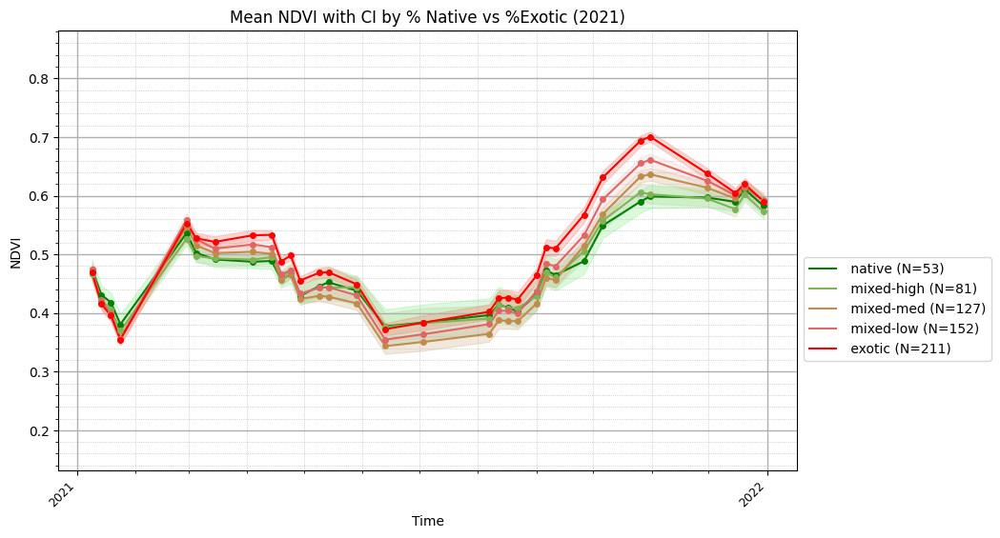

Plots not saved. Pass "outdir" and "stub" to function to save plots.


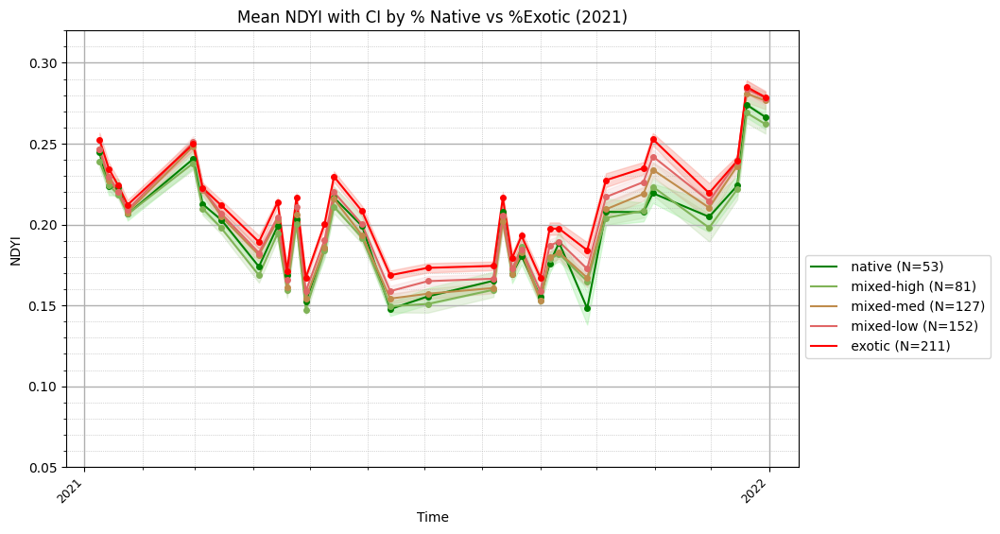

Plots not saved. Pass "outdir" and "stub" to function to save plots.


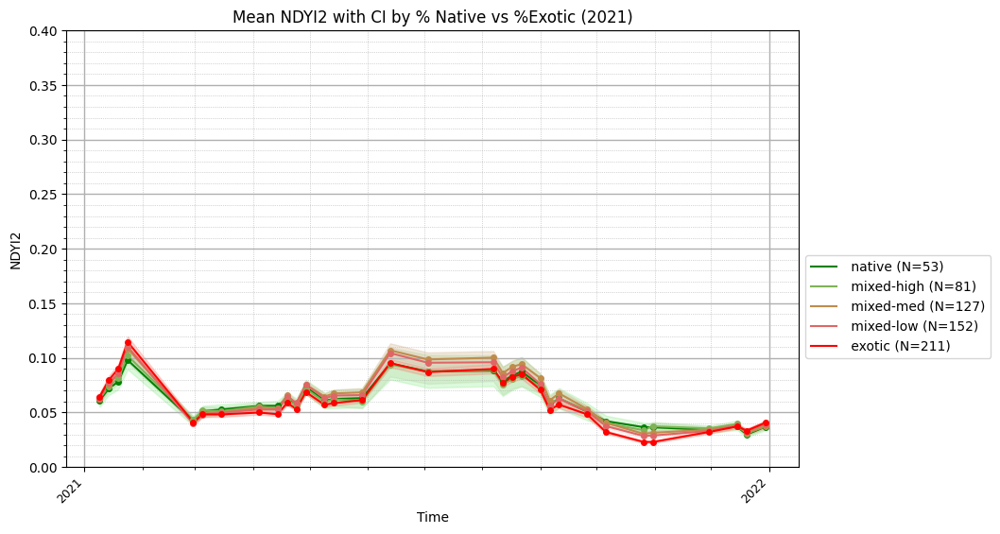

Plots not saved. Pass "outdir" and "stub" to function to save plots.


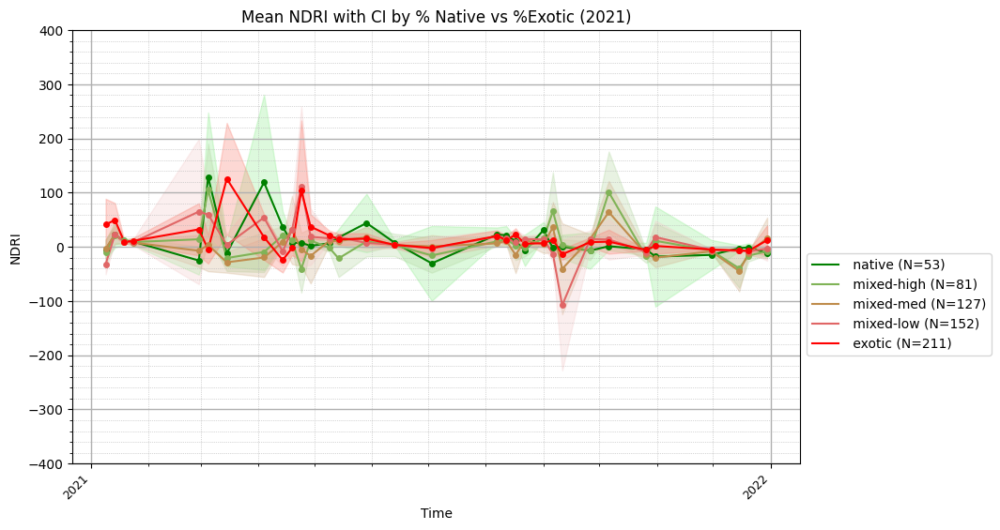

Plots not saved. Pass "outdir" and "stub" to function to save plots.


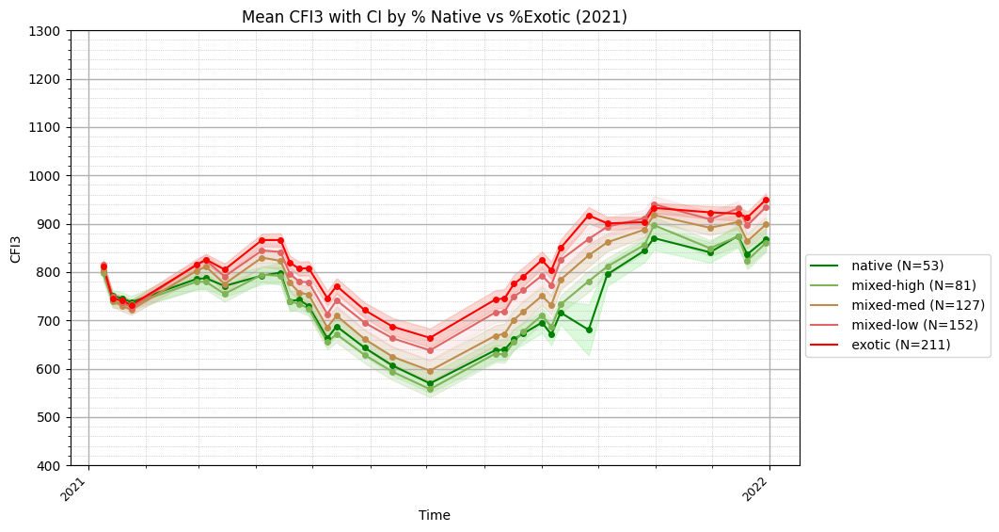

Plots not saved. Pass "outdir" and "stub" to function to save plots.


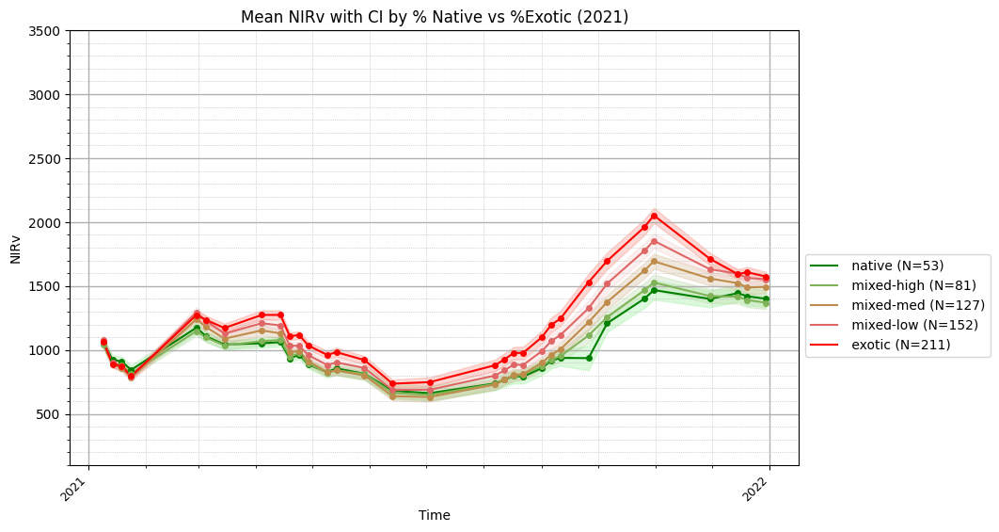

Plots not saved. Pass "outdir" and "stub" to function to save plots.


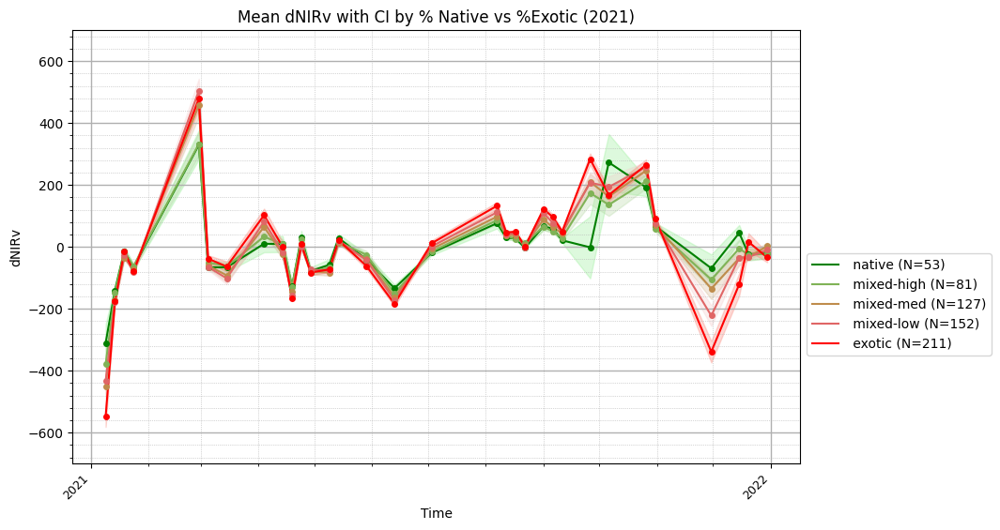

Plots not saved. Pass "outdir" and "stub" to function to save plots.


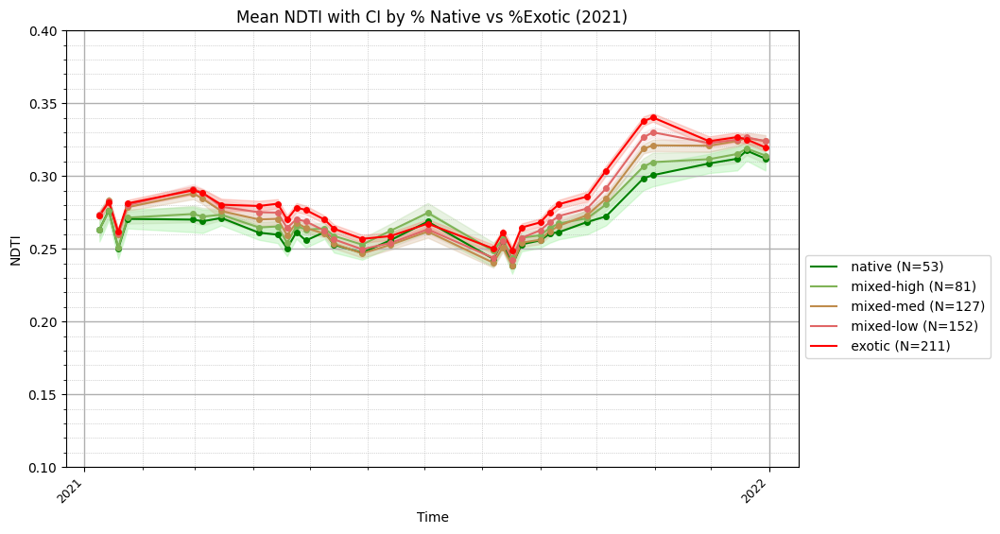

Plots not saved. Pass "outdir" and "stub" to function to save plots.


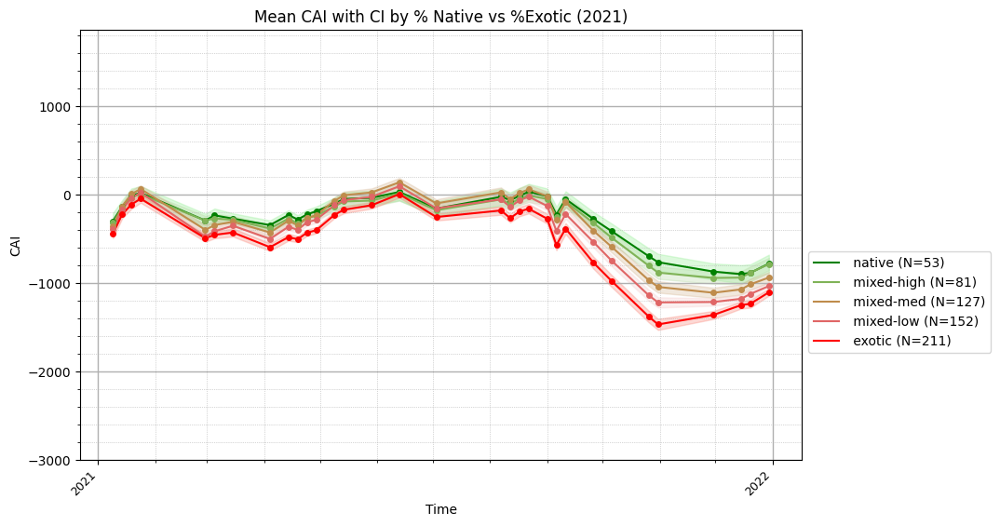

Plots not saved. Pass "outdir" and "stub" to function to save plots.


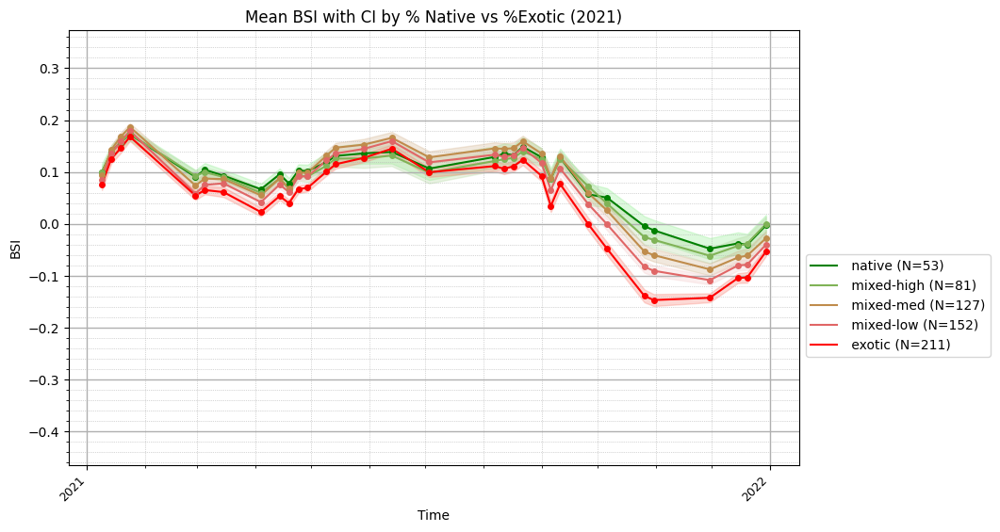

Plots not saved. Pass "outdir" and "stub" to function to save plots.


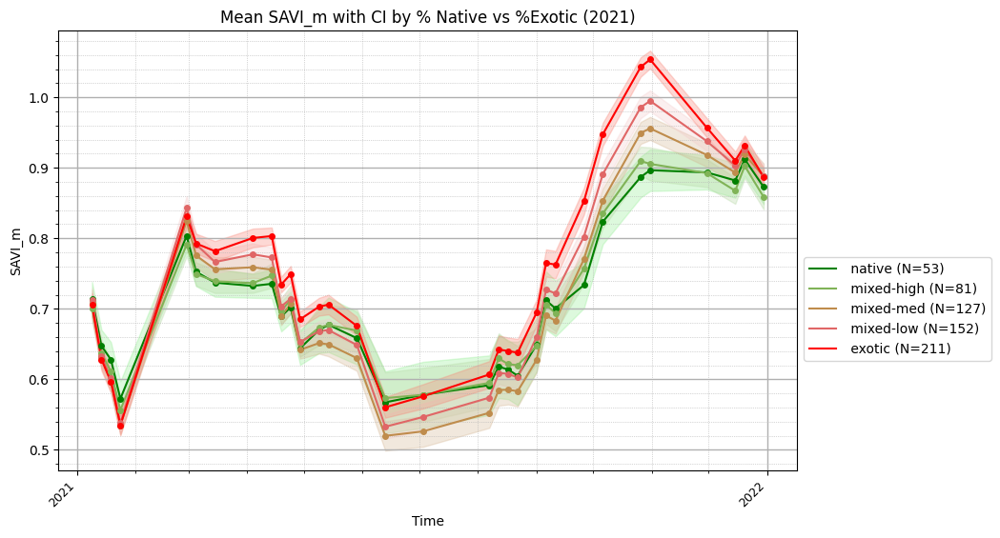

Plots not saved. Pass "outdir" and "stub" to function to save plots.


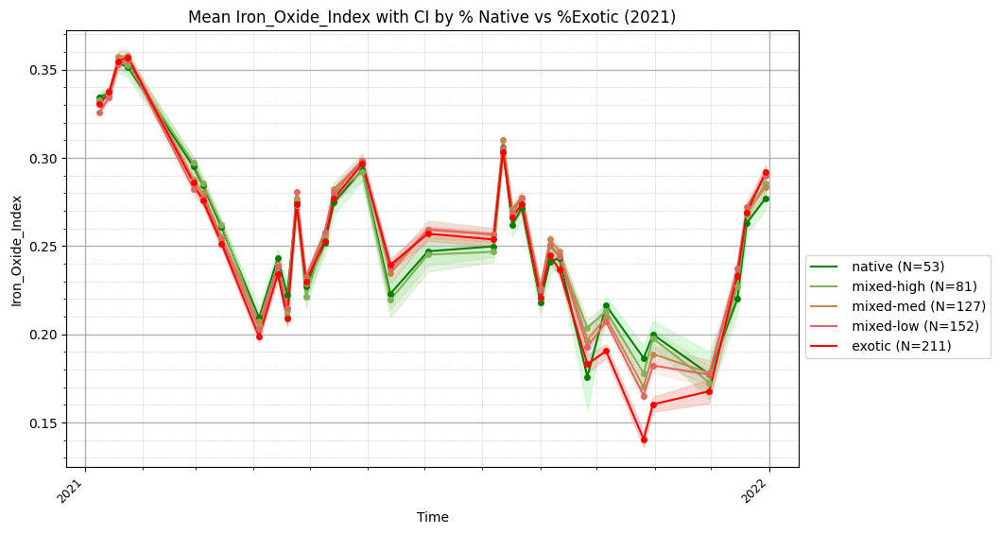

Plots not saved. Pass "outdir" and "stub" to function to save plots.


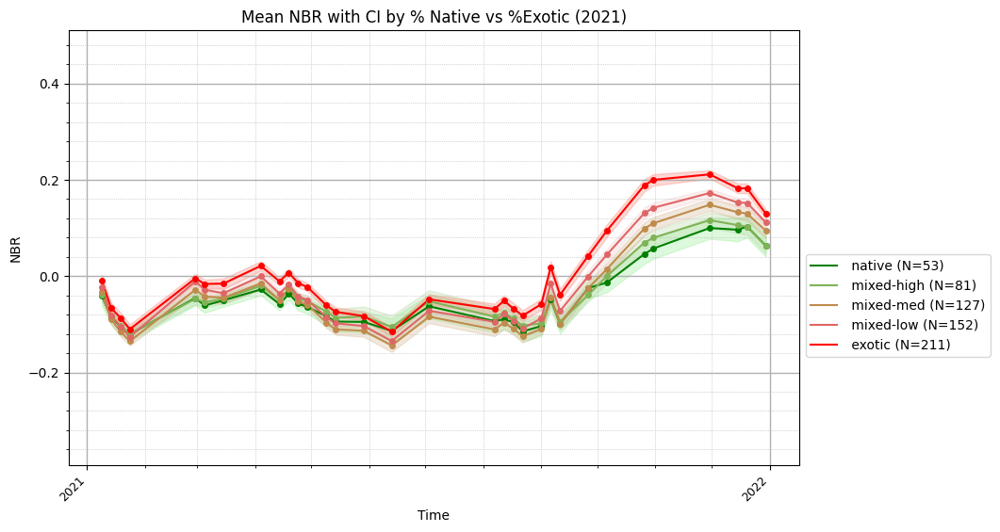

Plots not saved. Pass "outdir" and "stub" to function to save plots.


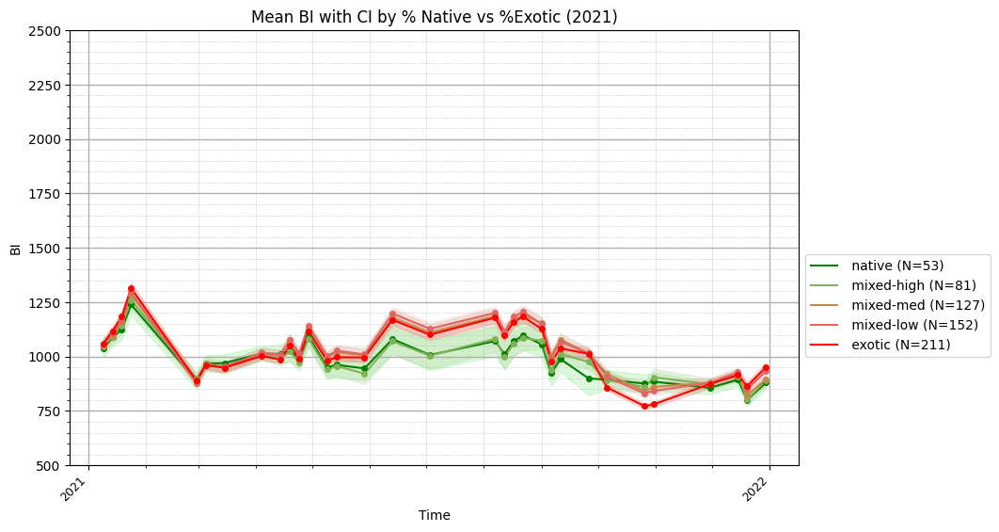

In [57]:
spectral_indices = ['CAI', 'NDVI', 'NIRv', 'dNIRv', 'CFI3', 'NDTI2', 'NDYI', 'NDYI2']
spectral_indices = ['NDVI', 'NDYI', 'NDYI2', 'NDRI', 'CFI3', 'NIRv', 'dNIRv', 'NDTI', 'CAI', 'BSI', 'SAVI_m', 'EVI', 'Iron_Oxide_Index', 'NBR', 'BI']

#spectral_indices = ['CAI', 'NDVI']

plot_each_year = False  # Set to True if you want to plot all years available in the dataset one year at a time (makes lots of figures!)
save_outputs = False

if on_nci:
    output_filepath = outdir  + stub
else:
     output_filepath = Path(desktop_dir + '\\'+ outdir + '\\' + stub)

classification_variable = 'class_all_str'
classification_variable = 'type'
classification_variable = 'class_scaled'

extra_text="_max_min"
extra_text=""


if not(save_outputs):
    output_filepath = None

# Create an array of all years available in the data:
if plot_each_year == True:
    years_list = np.unique(np.array(ds_weekly_paddocks.time, dtype='datetime64[ns]').astype('datetime64[Y]').astype(int) + 1970)
else:
    #Set years_list = None to plot all years in one figure
    years_list = [None] 
    years_list = [2021]

print("Plotting data for:", years_list)
print("Indices:", spectral_indices)
print("Total figures created will be:", (len(years_list) * len(spectral_indices)), "\n")
for cur_year in years_list:
    if cur_year != None:
        print("Now on", cur_year)
    for spectral_index in spectral_indices:
         plot_mean_sd_by_type(ds_weekly_paddocks, 
                              spectral_index=spectral_index, 
                              group_by_variable=classification_variable,
                              indices_max_min_values = indices_max_min_values,
                              year=cur_year, 
                              error_type = "CI", 
                              outdir=output_filepath, stub=stub, 
                              extra_text=extra_text
                             )
